In [1]:
import os
import torch
import random
import shutil
import pickle
import numpy as np
import torchvision
import torch.nn as nn

from tqdm import tqdm
from matplotlib import pyplot as plt

from torch.optim import Adam
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [3]:
config = {
    'model_params': {
        'in_channels': 1,
        'convbn_blocks': 3,
        'conv_kernel_size': [2, 2, 2],
        'conv_kernel_strides': [2, 2, 2],
        'convbn_channels': [1, 16, 32, 64],
        'enc_fc_layers': [576, 128, 2],
        'enc_fc_mu_activation': None,
        'enc_fc_var_activation': None,
        'conv_activation_fn': 'leaky',
        'dec_fc_layers': [2, 128, 576],
        'dec_fc_activation_fn': 'leaky',
        'enc_fc_activation_fn': 'leaky',
        'transpose_bn_blocks': 3,
        'transposebn_channels': [64, 32, 16, 1],
        'transpose_kernel_size': [3, 2, 2],
        'transpose_kernel_strides': [2, 2, 2],
        'transpose_activation_fn': 'tanh',
        'log_variance': True,
        'latent_dim': 2,
        'concat_channel': False,
        'decoder_fc_condition': False,
        'num_classes': 10,
        'conditional': False
    },
    'train_params': {
        'task_name': 'vae_kl',
        'batch_size': 64,
        'epochs': 10,
        'kl_weight': 1e-5,
        'lr': 0.005,
        'crit': 'l2',
        'ckpt_name': 'best_vae_kl_ckpt.pth',
        'seed': 111,
        'save_training_image': False,
        'output_train_dir': 'output',
        'save_latent_plot': True
    }
}


In [4]:
import torch
import torch.nn as nn

r"""
A very simple VAE which has the following architecture

Encoder
    For Conditional model we stack num_classes empty channels onto the image
    We make the gt_label index channel as `1`

    N * Conv BN Activation Blocks
    FC layers for mean
    FC layers for variance

Decoder
    For Conditional model we also concat the one hot label feature onto the z input

    FC Layers taking z to higher dimensional feature
    N * ConvTranspose BN Activation Blocks
"""

class VAE(nn.Module):
    def __init__(self, config):
        super(VAE, self).__init__()

        activation_map = {
            'relu': nn.ReLU(),
            'leaky': nn.LeakyReLU(),
            'tanh': nn.Tanh(),
            'gelu': nn.GELU(),
            'silu': nn.SiLU()
        }

        self.config = config

        assert config['transpose_activation_fn'] is None or config['transpose_activation_fn'] in activation_map
        assert config['dec_fc_activation_fn'] is None or config['dec_fc_activation_fn'] in activation_map
        assert config['conv_activation_fn'] is None or config['conv_activation_fn'] in activation_map
        assert config['enc_fc_activation_fn'] is None or config['enc_fc_activation_fn'] in activation_map
        assert config['enc_fc_layers'][-1] == config['dec_fc_layers'][0] == config['latent_dim'], \
            "Latent dimension must be same as fc layers number"

        self.num_classes = config['num_classes']
        self.transposebn_channels = config['transposebn_channels']
        self.latent_dim = config['latent_dim']
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

        model_config = dict(config)

        if model_config['concat_channel'] and model_config['conditional']:
            model_config['convbn_channels'] = model_config['convbn_channels'].copy()
            model_config['convbn_channels'][0] += self.num_classes

        self.encoder_layers = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(
                    model_config['convbn_channels'][i],
                    model_config['convbn_channels'][i + 1],
                    kernel_size=model_config['conv_kernel_size'][i],
                    stride=model_config['conv_kernel_strides'][i]
                ),
                nn.BatchNorm2d(model_config['convbn_channels'][i + 1]),
                activation_map[model_config['conv_activation_fn']]
            )
            for i in range(model_config['convbn_blocks'])
        ])

        encoder_mu_activation = (
            nn.Identity()
            if model_config['enc_fc_mu_activation'] is None
            else activation_map[model_config['enc_fc_mu_activation']]
        )

        self.encoder_mu_fc = nn.ModuleList([
            nn.Sequential(
                nn.Linear(model_config['enc_fc_layers'][i], model_config['enc_fc_layers'][i + 1]),
                encoder_mu_activation
            )
            for i in range(len(model_config['enc_fc_layers']) - 1)
        ])

        encoder_var_activation = (
            nn.Identity()
            if model_config['enc_fc_var_activation'] is None
            else activation_map[model_config['enc_fc_var_activation']]
        )

        self.encoder_var_fc = nn.ModuleList([
            nn.Sequential(
                nn.Linear(model_config['enc_fc_layers'][i], model_config['enc_fc_layers'][i + 1]),
                encoder_var_activation
            )
            for i in range(len(model_config['enc_fc_layers']) - 1)
        ])

        if model_config['decoder_fc_condition'] and model_config['conditional']:
            model_config['dec_fc_layers'] = model_config['dec_fc_layers'].copy()
            model_config['dec_fc_layers'][0] += self.num_classes

        self.decoder_fc = nn.ModuleList([
            nn.Sequential(
                nn.Linear(model_config['dec_fc_layers'][i], model_config['dec_fc_layers'][i + 1]),
                activation_map[model_config['dec_fc_activation_fn']]
            )
            for i in range(len(model_config['dec_fc_layers']) - 1)
        ])

        self.decoder_layers = nn.ModuleList([
            nn.Sequential(
                nn.ConvTranspose2d(
                    model_config['transposebn_channels'][i],
                    model_config['transposebn_channels'][i + 1],
                    kernel_size=model_config['transpose_kernel_size'][i],
                    stride=model_config['transpose_kernel_strides'][i]
                ),
                nn.BatchNorm2d(model_config['transposebn_channels'][i + 1]),
                activation_map[model_config['transpose_activation_fn']]
            )
            for i in range(model_config['transpose_bn_blocks'])
        ])

    def forward(self, x, label=None):
        out = x

        if self.config['concat_channel'] and self.config['conditional']:
            label_ch_map = torch.zeros((x.size(0), self.num_classes, *x.shape[2:]), device=self.device)
            batch_idx = torch.arange(0, x.size(0), device=self.device)
            label_idx = label[batch_idx]
            label_ch_map[batch_idx, label_idx, :, :] = 1
            out = torch.cat([x, label_ch_map], dim=1)

        for layer in self.encoder_layers:
            out = layer(out)

        out = out.reshape((x.size(0), -1))

        mu = out
        for layer in self.encoder_mu_fc:
            mu = layer(mu)

        std = out
        for layer in self.encoder_var_fc:
            std = layer(std)

        z = self.reparameterize(mu, std)
        generated_out = self.generate(z, label)

        if self.config['log_variance']:
            return {
                'mean': mu,
                'log_variance': std,
                'image': generated_out,
            }
        else:
            return {
                'mean': mu,
                'std': std,
                'image': generated_out,
            }

    def generate(self, z, label=None):
        out = z

        if self.config['decoder_fc_condition'] and self.config['conditional']:
            assert label is not None, "Label cannot be none for conditional generation"

            label_fc_input = torch.zeros((z.size(0), self.num_classes), device=self.device)
            batch_idx = torch.arange(0, z.size(0), device=self.device)
            label_idx = label[batch_idx]
            label_fc_input[batch_idx, label_idx] = 1
            out = torch.cat([out, label_fc_input], dim=-1)

        for layer in self.decoder_fc:
            out = layer(out)

        hw = out.size(-1) / self.transposebn_channels[0]
        spatial = int(np.sqrt(hw))
        assert spatial * spatial == hw

        out = out.reshape((z.size(0), -1, spatial, spatial))

        for layer in self.decoder_layers:
            out = layer(out)

        return out

    def sample(self, label=None, num_images=1, z=None):
        if z is None:
            z = torch.randn((num_images, self.latent_dim), device=self.device)

        if self.config['conditional']:
            assert label is not None, "Label cannot be none for conditional sampling"
            assert label.size(0) == num_images

        assert z.size(0) == num_images
        out = self.generate(z, label)
        return out

    def reparameterize(self, mu, std_or_logvariance):
        if self.config['log_variance']:
            std = torch.exp(0.5 * std_or_logvariance)
        else:
            std = std_or_logvariance

        z = torch.randn_like(std)
        return z * std + mu




In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=transform
)

test_dataset = datasets.MNIST(
    root='./data',
    train=False,
    download=True,
    transform=transform
)


train_loader = DataLoader(
    train_dataset,
    batch_size=config['train_params']['batch_size'],
    shuffle=True,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=config['train_params']['batch_size'],
    shuffle=False,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

100%|██████████| 9.91M/9.91M [00:00<00:00, 138MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 63.3MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 106MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 18.1MB/s]


In [6]:
def train_for_one_epoch(epoch_idx, model, data_loader, optimizer, criterion, config):
    recon_losses = []
    kl_losses = []
    losses = []

    model.train()

    for im, label in tqdm(data_loader):
        im = im.float().to(device)
        label = label.long().to(device)

        optimizer.zero_grad()

        output = model(im, label)
        mean = output['mean']

        if config['model_params']['log_variance']:
            log_variance = output['log_variance']
            kl_loss = torch.mean(
                0.5 * torch.sum(torch.exp(log_variance) + mean ** 2 - 1 - log_variance, dim=-1)
            )
        else:
            std = output['std']
            kl_loss = torch.mean(
                0.5 * torch.sum(std ** 2 + mean ** 2 - 1 - torch.log(std ** 2 + 1e-8), dim=-1)
            )

        generated_im = output['image']
        recon_loss = criterion(generated_im, im)
        loss = recon_loss + config['train_params']['kl_weight'] * kl_loss

        recon_losses.append(recon_loss.item())
        kl_losses.append(kl_loss.item())
        losses.append(loss.item())

        loss.backward()
        optimizer.step()

    print(
        f'Epoch {epoch_idx+1} | Recon Loss: {np.mean(recon_losses):.4f} | KL Loss: {np.mean(kl_losses):.4f}'
    )

    return np.mean(losses)


In [7]:
def reconstruct(config, model, dataset, num_images=100):
    print('Generating reconstructions')

    save_dir = os.path.join(config['train_params']['task_name'], config['train_params']['output_train_dir'])
    os.makedirs(save_dir, exist_ok=True)

    idxs = torch.randint(0, len(dataset), (num_images,))
    ims = torch.stack([dataset[idx][0] for idx in idxs]).float().to(device)
    labels = torch.tensor([dataset[idx][1] for idx in idxs], dtype=torch.long).to(device)

    with torch.no_grad():
        output = model(ims, labels)
        generated_im = output['image']

    ims = (ims + 1) / 2
    generated_im = (generated_im + 1) / 2

    out = torch.cat([ims, generated_im], dim=3)
    grid = make_grid(out, nrow=10)

    img = torchvision.transforms.ToPILImage()(grid.cpu())
    img.save(os.path.join(save_dir, 'reconstruction.png'))
    plt.figure(figsize=(12, 12))
    plt.imshow(np.array(img), cmap='gray')
    plt.axis('off')
    plt.show()


def visualize_latent_space(config, model, data_loader, save_fig_path):
    labels = []
    means = []

    model.eval()
    with torch.no_grad():
        for im, label in tqdm(data_loader):
            im = im.float().to(device)
            label = label.long().to(device)
            output = model(im, label)
            labels.append(label.cpu())
            means.append(output['mean'].cpu())

    labels = torch.cat(labels, dim=0).reshape(-1)
    means = torch.cat(means, dim=0)

    if model.latent_dim != 2:
        print('Latent dimension > 2 and hence projecting')
        U, S, V = torch.pca_lowrank(means, center=True, niter=2)
        means = torch.matmul(means, V[:, :2])

        os.makedirs(config['train_params']['task_name'], exist_ok=True)
        pickle.dump(V, open(f"{config['train_params']['task_name']}/pca_matrix.pkl", 'wb'))

    plt.figure(figsize=(8, 6))
    for num in range(10):
        idxs = torch.where(labels == num)[0]
        plt.scatter(
            means[idxs, 0].numpy(),
            means[idxs, 1].numpy(),
            s=8,
            label=str(num),
            alpha=0.7
        )

    plt.legend()
    plt.grid(True)
    plt.savefig(save_fig_path)
    plt.show()


def visualize_interpolation(config, model, dataset, interpolation_steps=20, save_dir='interp'):
    print('Interpolating between images')

    base_dir = os.path.join(config['train_params']['task_name'], config['train_params']['output_train_dir'])
    os.makedirs(base_dir, exist_ok=True)

    interp_dir = os.path.join(base_dir, save_dir)
    if os.path.exists(interp_dir):
        shutil.rmtree(interp_dir)
    os.mkdir(interp_dir)

    idxs = torch.randint(0, len(dataset), (2,))
    ims = torch.stack([dataset[idx][0] for idx in idxs]).float().to(device)
    labels = torch.tensor([dataset[idx][1] for idx in idxs], dtype=torch.long).to(device)

    with torch.no_grad():
        means = model(ims, labels)['mean']

        factors = torch.linspace(0, 1.0, steps=interpolation_steps).to(device)
        means_start = means[0]
        means_end = means[1]
        interp_means = factors[:, None] * means_end[None, :] + (1 - factors[:, None]) * means_start[None, :]
        out = model.generate(interp_means)

    out = (out + 1) / 2
    grid = make_grid(out, nrow=interpolation_steps)
    img = torchvision.transforms.ToPILImage()(grid.cpu())
    img.save(os.path.join(base_dir, 'interpolation.png'))

    plt.figure(figsize=(20, 3))
    plt.imshow(np.array(img), cmap='gray')
    plt.axis('off')
    plt.show()


def visualize_manifold(config, model):
    if model.latent_dim != 2:
        print('Manifold visualization is only supported directly for latent_dim=2')
        return

    print('Generating manifold')

    save_dir = os.path.join(config['train_params']['task_name'], config['train_params']['output_train_dir'])
    os.makedirs(save_dir, exist_ok=True)

    xs = torch.linspace(-3, 3, 20)
    ys = torch.linspace(-3, 3, 20)
    zs = []

    for y in ys:
        for x in xs:
            zs.append(torch.tensor([x, y]))

    zs = torch.stack(zs).float().to(device)

    with torch.no_grad():
        generated_ims = model.sample(num_images=zs.size(0), z=zs)

    generated_ims = (generated_ims + 1) / 2
    grid = make_grid(generated_ims, nrow=20)
    img = torchvision.transforms.ToPILImage()(grid.cpu())
    img.save(os.path.join(save_dir, 'manifold.png'))

    plt.figure(figsize=(10, 10))
    plt.imshow(np.array(img), cmap='gray')
    plt.axis('off')
    plt.show()


In [8]:
def get_model(config):
    model = VAE(config=config['model_params'])
    return model

In [9]:
def train(config, train_loader, test_loader):
    print(config)

    seed = config['train_params']['seed']
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    model = get_model(config).to(device)

    optimizer = Adam(model.parameters(), lr=config['train_params']['lr'])
    scheduler = ReduceLROnPlateau(optimizer, factor=0.5, patience=1)

    criterion = {
        'l1': torch.nn.L1Loss(),
        'l2': torch.nn.MSELoss()
    }[config['train_params']['crit']]

    task_dir = config['train_params']['task_name']
    output_dir = os.path.join(task_dir, config['train_params']['output_train_dir'])

    os.makedirs(output_dir, exist_ok=True)

    best_loss = np.inf
    latent_im_path = os.path.join(output_dir, 'latent_epoch_{}.png')

    visualize_latent_space(config, model, test_loader, save_fig_path=latent_im_path.format(0))

    for epoch_idx in range(config['train_params']['epochs']):
        mean_loss = train_for_one_epoch(epoch_idx, model, train_loader, optimizer, criterion, config)

        if config['train_params']['save_latent_plot']:
            visualize_latent_space(
                config,
                model,
                test_loader,
                save_fig_path=latent_im_path.format(epoch_idx + 1)
            )

        scheduler.step(mean_loss)

        if mean_loss < best_loss:
            print(f'Improved Loss to {mean_loss:.4f} .... Saving Model')
            torch.save(
                model.state_dict(),
                os.path.join(task_dir, config['train_params']['ckpt_name'])
            )
            best_loss = mean_loss
        else:
            print('No Loss Improvement')

    return model


In [10]:
def inference(config, test_dataset, test_loader):
    model = get_model(config).to(device)
    model.load_state_dict(
        torch.load(
            os.path.join(config['train_params']['task_name'], config['train_params']['ckpt_name']),
            map_location=device
        )
    )
    model.eval()

    latent_im_path = os.path.join(
        config['train_params']['task_name'],
        config['train_params']['output_train_dir'],
        'latent_inference.png'
    )

    visualize_latent_space(config, model, test_loader, latent_im_path)
    visualize_interpolation(config, model, test_dataset)
    reconstruct(config, model, test_dataset)
    visualize_manifold(config, model)


{'model_params': {'in_channels': 1, 'convbn_blocks': 3, 'conv_kernel_size': [2, 2, 2], 'conv_kernel_strides': [2, 2, 2], 'convbn_channels': [1, 16, 32, 64], 'enc_fc_layers': [576, 128, 2], 'enc_fc_mu_activation': None, 'enc_fc_var_activation': None, 'conv_activation_fn': 'leaky', 'dec_fc_layers': [2, 128, 576], 'dec_fc_activation_fn': 'leaky', 'enc_fc_activation_fn': 'leaky', 'transpose_bn_blocks': 3, 'transposebn_channels': [64, 32, 16, 1], 'transpose_kernel_size': [3, 2, 2], 'transpose_kernel_strides': [2, 2, 2], 'transpose_activation_fn': 'tanh', 'log_variance': True, 'latent_dim': 2, 'concat_channel': False, 'decoder_fc_condition': False, 'num_classes': 10, 'conditional': False}, 'train_params': {'task_name': 'vae_kl', 'batch_size': 64, 'epochs': 10, 'kl_weight': 1e-05, 'lr': 0.005, 'crit': 'l2', 'ckpt_name': 'best_vae_kl_ckpt.pth', 'seed': 111, 'save_training_image': False, 'output_train_dir': 'output', 'save_latent_plot': True}}


100%|██████████| 157/157 [00:02<00:00, 59.16it/s]


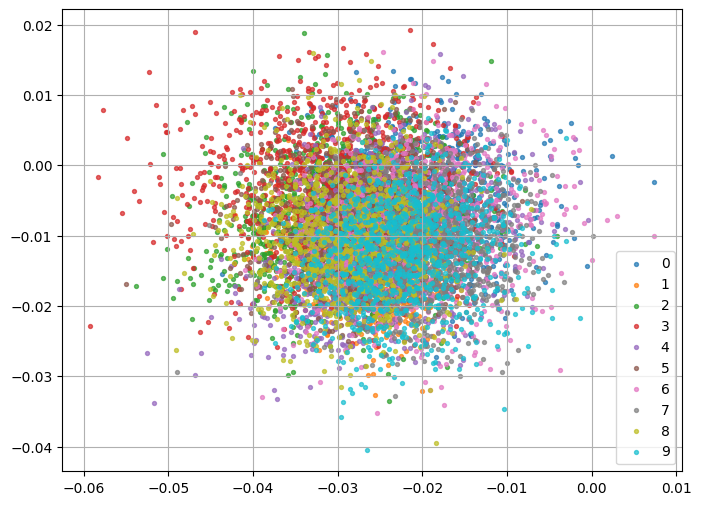

100%|██████████| 938/938 [00:10<00:00, 86.77it/s]


Epoch 1 | Recon Loss: 0.2722 | KL Loss: 38.0551


100%|██████████| 157/157 [00:01<00:00, 100.10it/s]


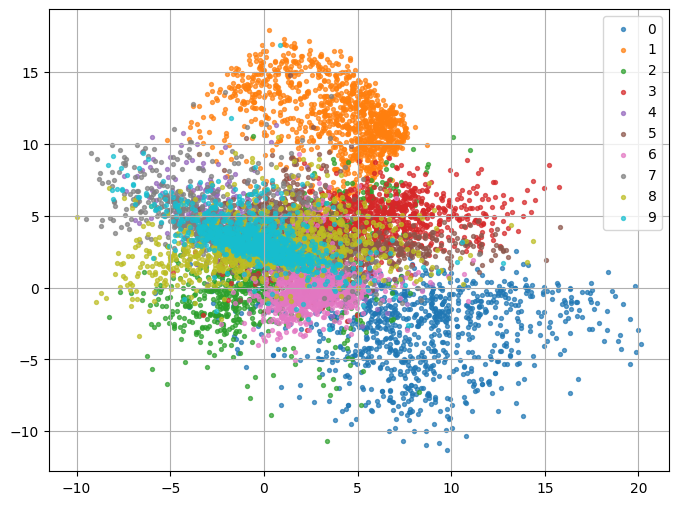

Improved Loss to 0.2725 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 90.48it/s]


Epoch 2 | Recon Loss: 0.1931 | KL Loss: 29.1451


100%|██████████| 157/157 [00:01<00:00, 97.29it/s] 


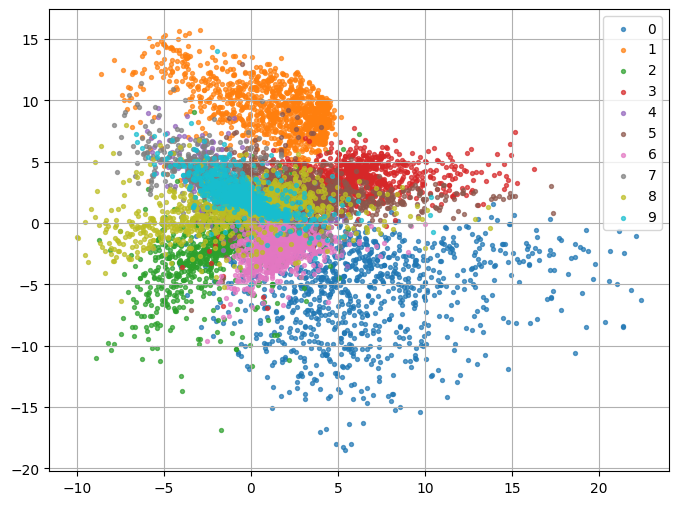

Improved Loss to 0.1934 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 89.58it/s]


Epoch 3 | Recon Loss: 0.1839 | KL Loss: 31.9506


100%|██████████| 157/157 [00:01<00:00, 100.23it/s]


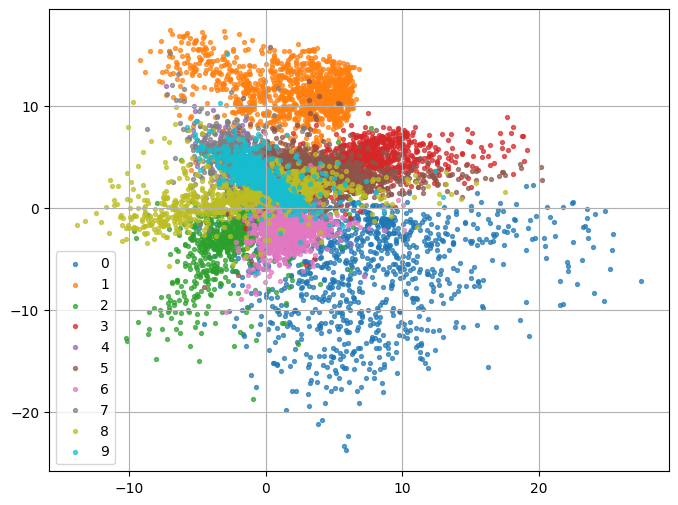

Improved Loss to 0.1842 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 90.17it/s]


Epoch 4 | Recon Loss: 0.1799 | KL Loss: 35.6873


100%|██████████| 157/157 [00:01<00:00, 93.08it/s] 


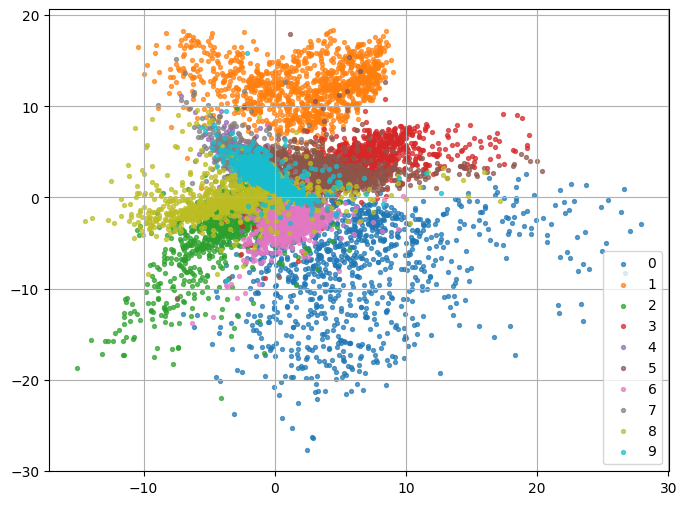

Improved Loss to 0.1803 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 89.04it/s]


Epoch 5 | Recon Loss: 0.1769 | KL Loss: 38.3866


100%|██████████| 157/157 [00:01<00:00, 97.35it/s] 


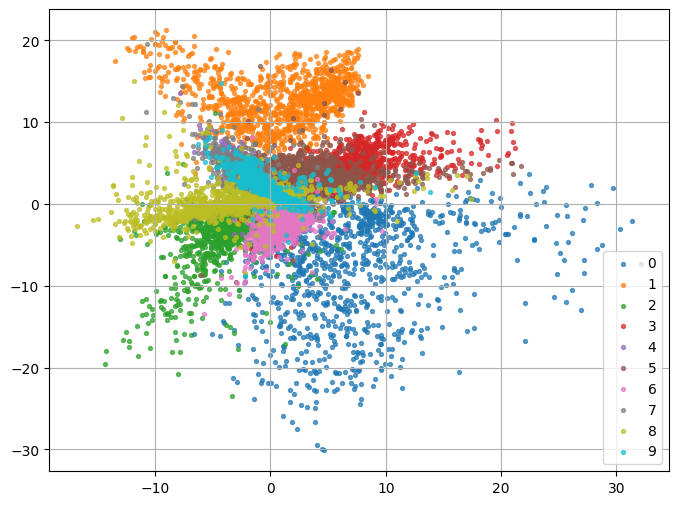

Improved Loss to 0.1773 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 89.35it/s]


Epoch 6 | Recon Loss: 0.1751 | KL Loss: 40.2647


100%|██████████| 157/157 [00:01<00:00, 96.88it/s] 


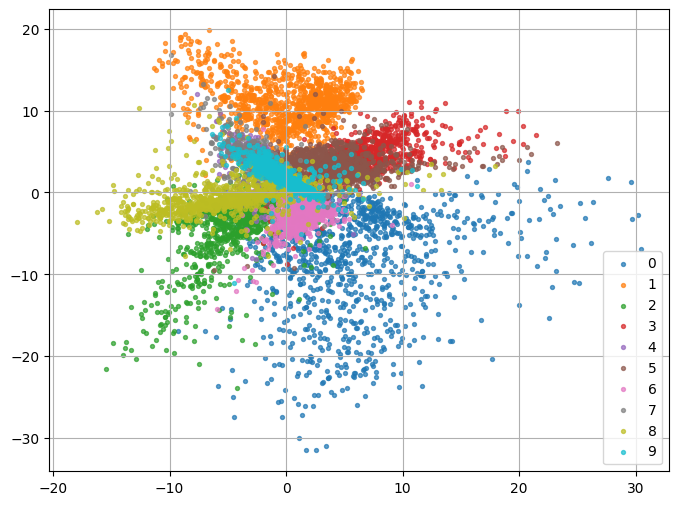

Improved Loss to 0.1755 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 89.90it/s]


Epoch 7 | Recon Loss: 0.1733 | KL Loss: 41.4174


100%|██████████| 157/157 [00:01<00:00, 95.70it/s] 


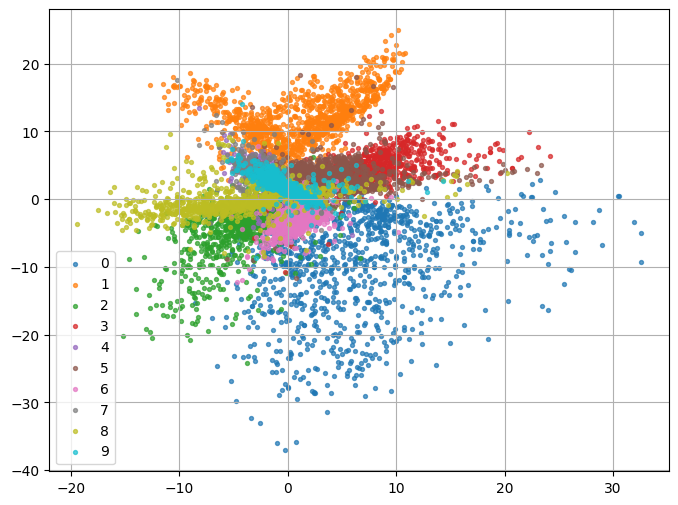

Improved Loss to 0.1737 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 89.23it/s]


Epoch 8 | Recon Loss: 0.1720 | KL Loss: 43.8110


100%|██████████| 157/157 [00:01<00:00, 95.30it/s] 


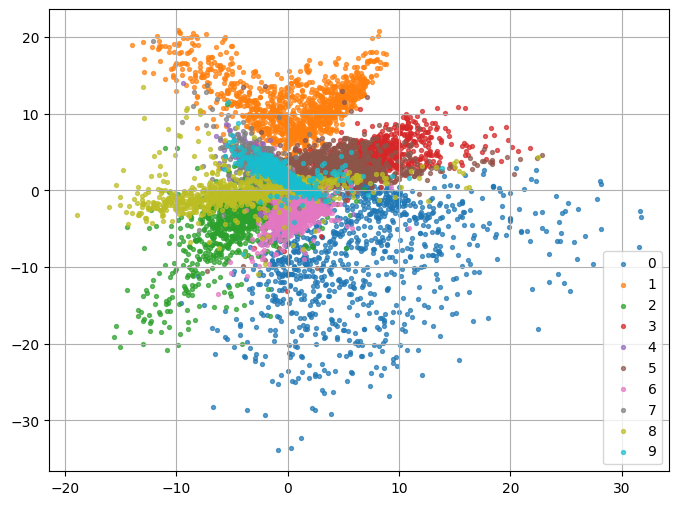

Improved Loss to 0.1724 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 90.77it/s]


Epoch 9 | Recon Loss: 0.1710 | KL Loss: 45.6781


100%|██████████| 157/157 [00:01<00:00, 94.73it/s] 


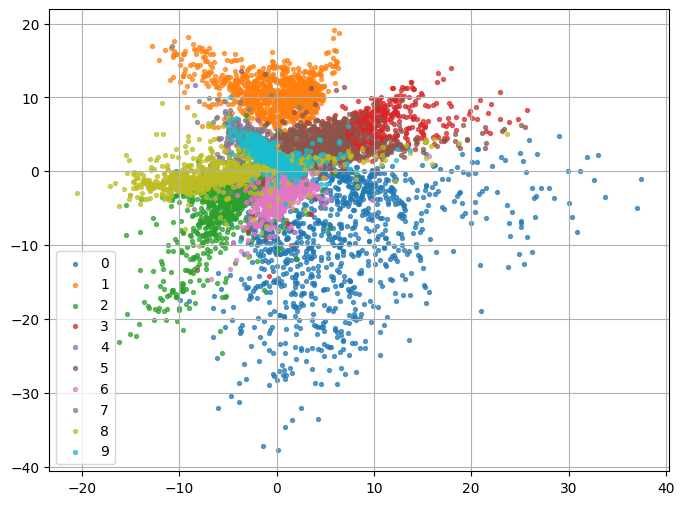

Improved Loss to 0.1714 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.80it/s]


Epoch 10 | Recon Loss: 0.1701 | KL Loss: 45.9226


100%|██████████| 157/157 [00:01<00:00, 96.57it/s]


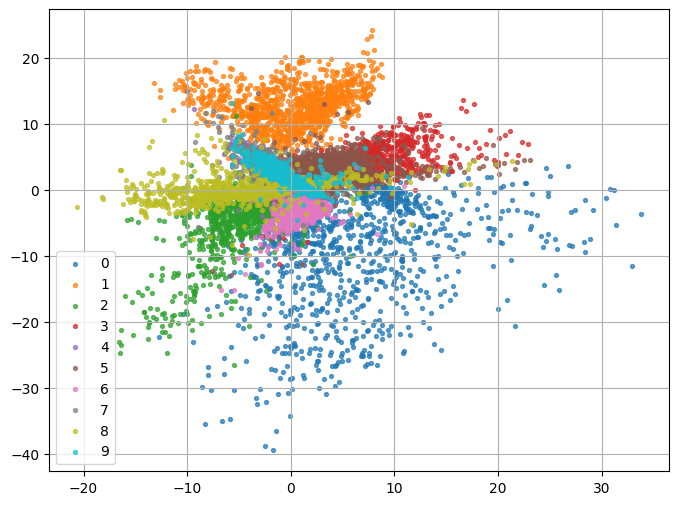

Improved Loss to 0.1706 .... Saving Model


In [11]:
model = train(config, train_loader, test_loader)


100%|██████████| 157/157 [00:01<00:00, 91.42it/s]


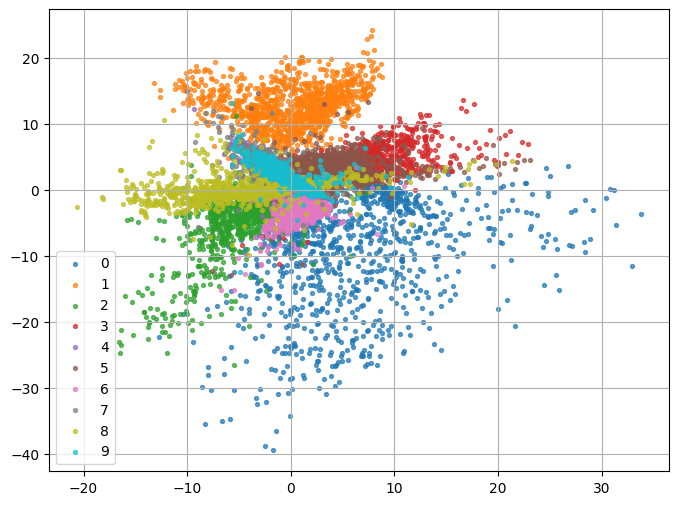

Interpolating between images


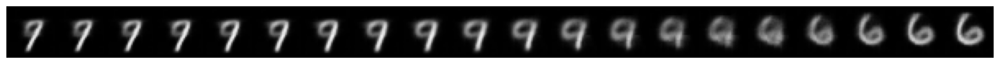

Generating reconstructions


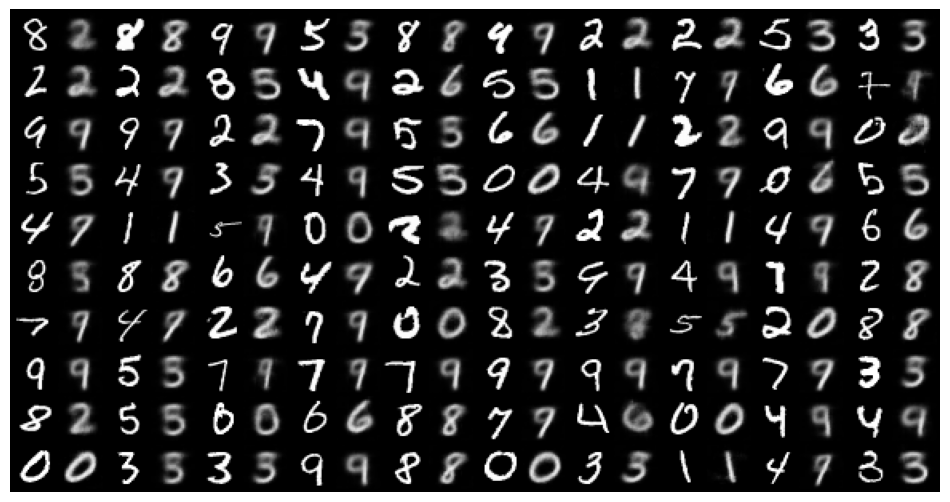

Generating manifold


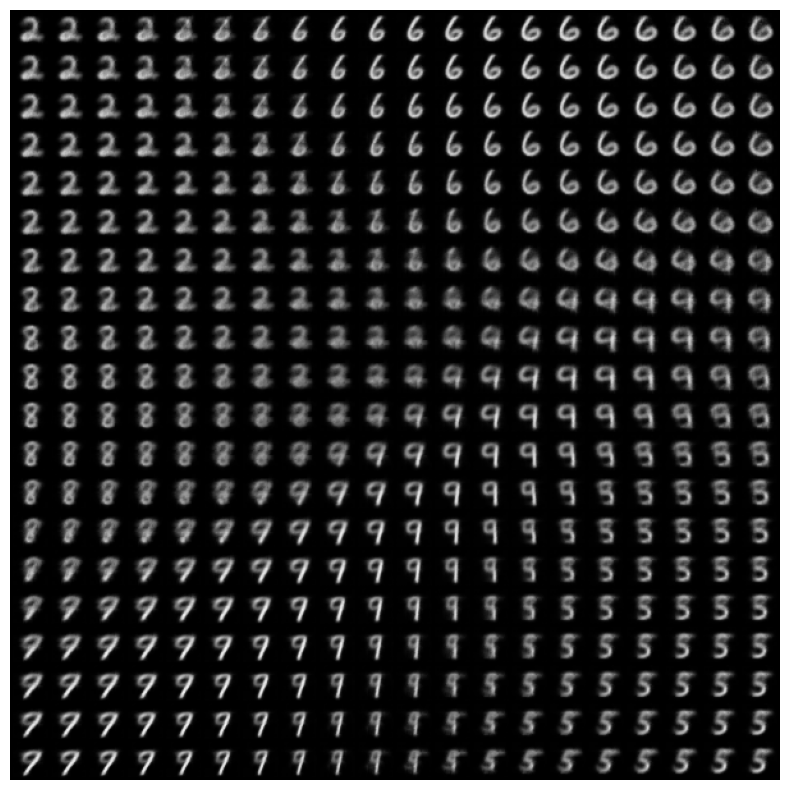

In [12]:
inference(config, test_dataset, test_loader)


# Answers

## A
The loss function used for training this network consists of 2 parts. The `recon_loss` which is MSE or MAE and the divergence loss. The divergence loss aligns $q(z|x)$ with the normal distribution that has been selected for the prior. The reason for doing this is so that the encoded examples do not go apart in the embedding space. If we do not use any sort of prior, our embedding space will collapse into a sparse state. This means each encoded example from the training set will be put in a different place of the embedding space and all the values between 2 actual examples, have no resemblance to the data. To solve this we assume a gaussian prior and align the embedding space with this gaussian. As a result of this the decoder becomes conditioned on the gaussian distribution ($N(0,I)$) and for generating new samples we only need to sample a gaussian and it is gauranteed that the decoder will make sense of it and generate valid data.

## B
For generation the fact that sampling close to a point results in a similar generated data point is ideal. If we want to create points from group A, we just need to sample from the region where datapoints from group A are concentrated. So conditioning the generation becomes easier.

The smoothness feature of the decoder is also good for interpolation. With the smoothness feature, when moving from datapoint A to datapoint B, the features of A start to morph and become simmilar to features of B.

The smoothness feature is a direct result of using a gaussian prior. As mentioned before there are 2 main contributing factors to the loss. Reconstruction loss and divergence. The divergence is forcing the distribution of all classes to the Gaussian, As a result most of the examples in a class occupy roughly the same space with a specific $\mu$ and $\sigma$. Now the reconstruction loss heavily punishes generations that are based on z and not close to x. So for minimizing this loss the model can't just memorize points and how to recreate them. It needs to learn how to reconstruct data around a point to minimze the reconstruction loss.

The problem with smoothness is that it uses divergence loss on all classes with a gaussian prior. This results in a zone close to the coordinate origin where there are samples of all the classes and the borders for a region are not well defined. So sampling from this space results in ambiguous generations. 

## C
Below are the results of training the network with `kl_weight` of 1e-8 and 1e-2. In the 1e-8 case, the gaussian prior conditioning has less effect and as a result the overall shape of the 10 classes looks less like a gaussian. In this case the distribution looks a lot like what you would see in a normal auto encoder. There is an extremly high variance in the placement of the datapoint in the final plot.

For the 1e-2 case the variance is extremly less. Many of the classes are centered on the origin of the coordinate system. The problem this compactness introduces is that there is no difference for some generated classes. For example there is no clear border between class 3,5 and 8. The reason for this is that different classes are mapped to the origin of the coordinate system.

The image quality of the 1e-8 version is extremely better than the 1e-2 version. The key reason for this is the compactness in 1e-2 version. When instances from multiple classes are too much close to eachother the decoder cannot learn a meaningful mapping from that region to the generated image. On the other hand, generating images for the 1e-8 version is a lot harder. Much of the classes do not follow the gaussian distribution and so sampling a gaussian only results in limited generation variety.

==============================Weight : 1e-08==============================
{'model_params': {'in_channels': 1, 'convbn_blocks': 3, 'conv_kernel_size': [2, 2, 2], 'conv_kernel_strides': [2, 2, 2], 'convbn_channels': [1, 16, 32, 64], 'enc_fc_layers': [576, 128, 2], 'enc_fc_mu_activation': None, 'enc_fc_var_activation': None, 'conv_activation_fn': 'leaky', 'dec_fc_layers': [2, 128, 576], 'dec_fc_activation_fn': 'leaky', 'enc_fc_activation_fn': 'leaky', 'transpose_bn_blocks': 3, 'transposebn_channels': [64, 32, 16, 1], 'transpose_kernel_size': [3, 2, 2], 'transpose_kernel_strides': [2, 2, 2], 'transpose_activation_fn': 'tanh', 'log_variance': True, 'latent_dim': 2, 'concat_channel': False, 'decoder_fc_condition': False, 'num_classes': 10, 'conditional': False}, 'train_params': {'task_name': 'vae_kl', 'batch_size': 64, 'epochs': 10, 'kl_weight': 1e-08, 'lr': 0.005, 'crit': 'l2', 'ckpt_name': 'best_vae_kl_ckpt.pth', 'seed': 111, 'save_training_image': False, 'output_train_dir': 'output', 'sa

100%|██████████| 157/157 [00:01<00:00, 95.44it/s] 


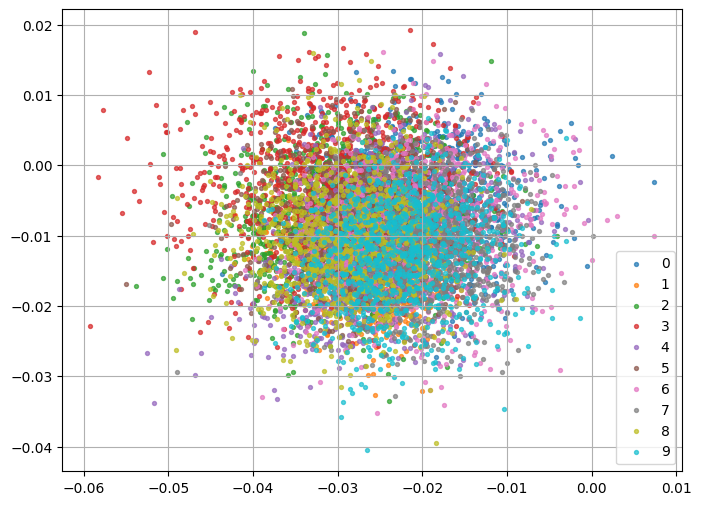

100%|██████████| 938/938 [00:10<00:00, 90.10it/s]


Epoch 1 | Recon Loss: 0.2749 | KL Loss: 299.6007


100%|██████████| 157/157 [00:01<00:00, 99.58it/s] 


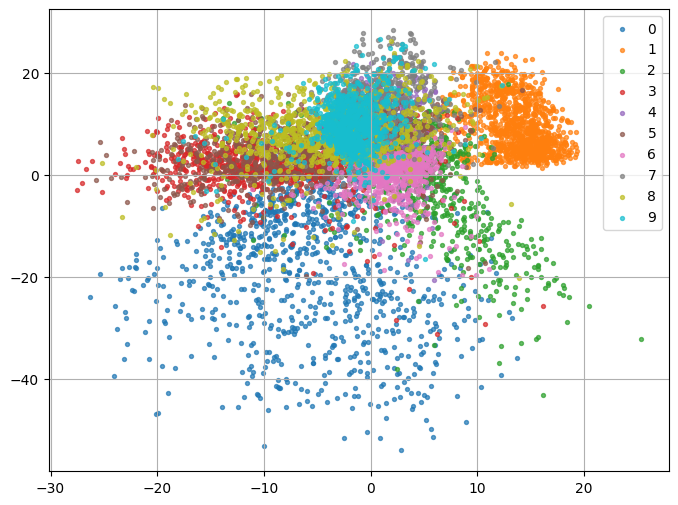

Improved Loss to 0.2750 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.69it/s]


Epoch 2 | Recon Loss: 0.1943 | KL Loss: 107.2021


100%|██████████| 157/157 [00:01<00:00, 98.74it/s] 


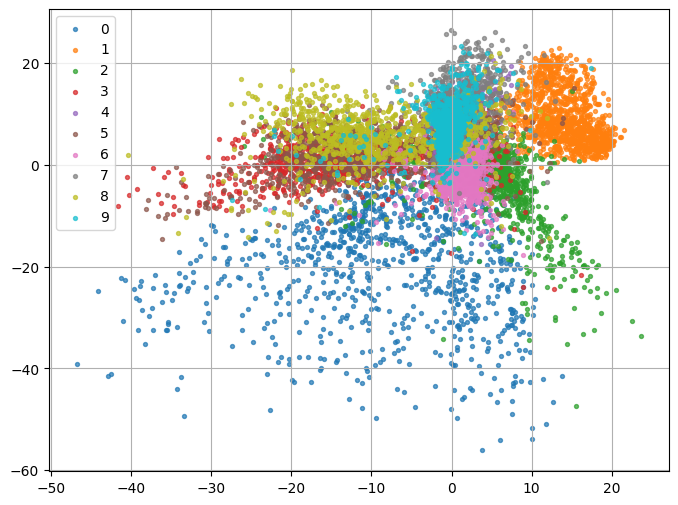

Improved Loss to 0.1943 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.00it/s]


Epoch 3 | Recon Loss: 0.1824 | KL Loss: 145.0733


100%|██████████| 157/157 [00:01<00:00, 97.31it/s] 


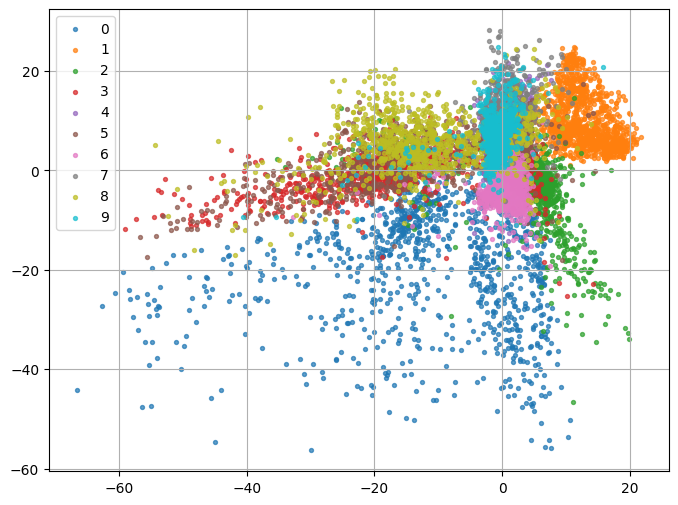

Improved Loss to 0.1824 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.73it/s]


Epoch 4 | Recon Loss: 0.1781 | KL Loss: 179.0452


100%|██████████| 157/157 [00:01<00:00, 99.03it/s] 


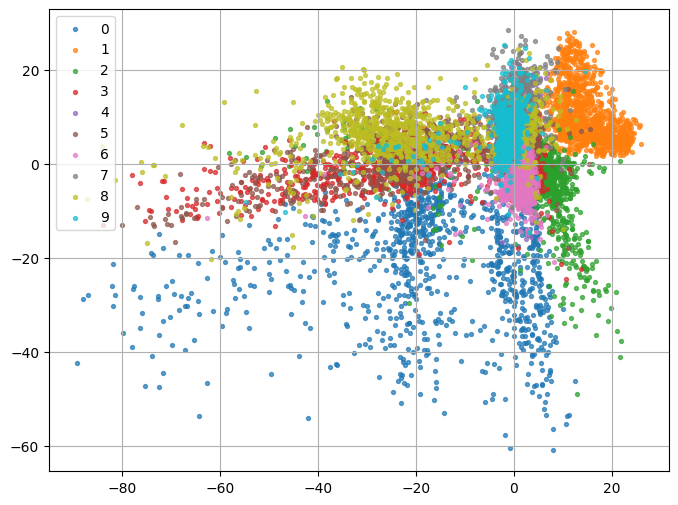

Improved Loss to 0.1781 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.13it/s]


Epoch 5 | Recon Loss: 0.1748 | KL Loss: 237.5654


100%|██████████| 157/157 [00:01<00:00, 98.69it/s] 


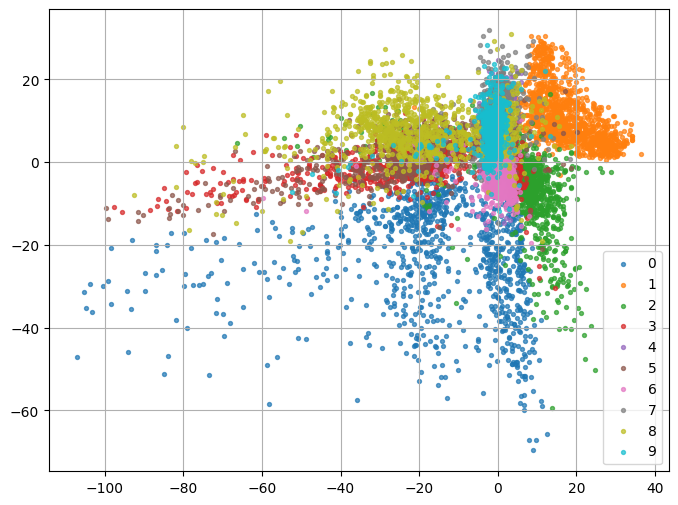

Improved Loss to 0.1748 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.83it/s]


Epoch 6 | Recon Loss: 0.1733 | KL Loss: 296.5165


100%|██████████| 157/157 [00:01<00:00, 99.45it/s] 


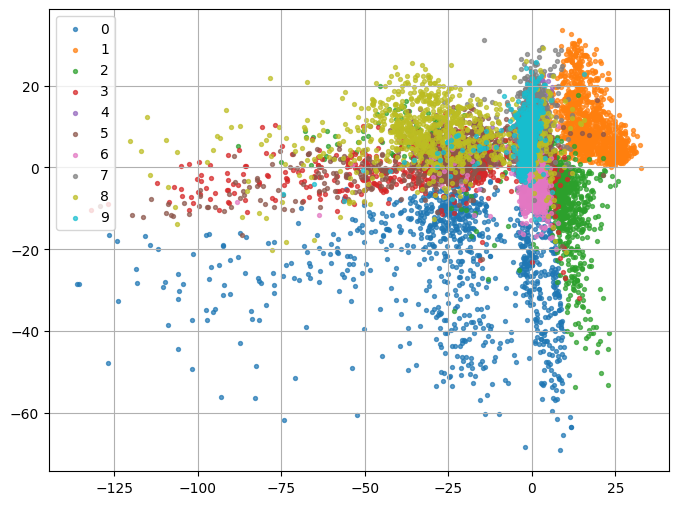

Improved Loss to 0.1733 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.82it/s]


Epoch 7 | Recon Loss: 0.1715 | KL Loss: 347.4562


100%|██████████| 157/157 [00:01<00:00, 99.04it/s] 


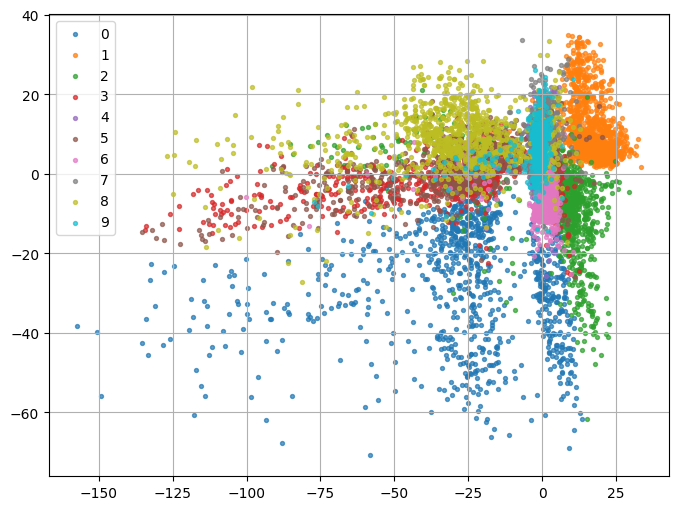

Improved Loss to 0.1715 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 92.65it/s] 


Epoch 8 | Recon Loss: 0.1704 | KL Loss: 403.0990


100%|██████████| 157/157 [00:01<00:00, 97.57it/s] 


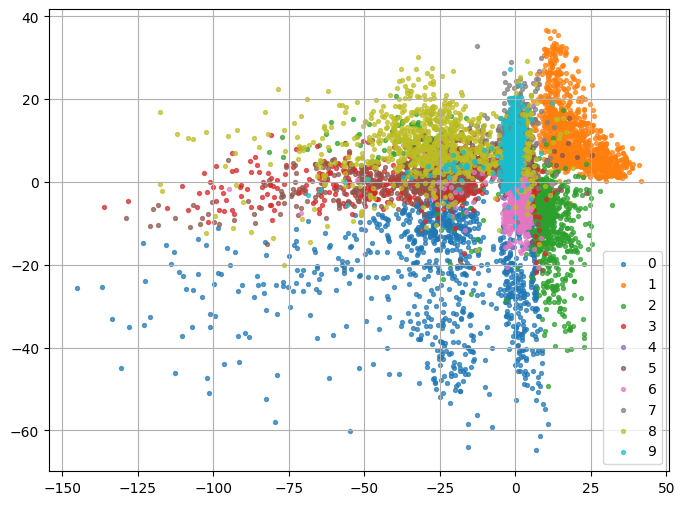

Improved Loss to 0.1704 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.92it/s] 


Epoch 9 | Recon Loss: 0.1696 | KL Loss: 446.5437


100%|██████████| 157/157 [00:01<00:00, 97.98it/s] 


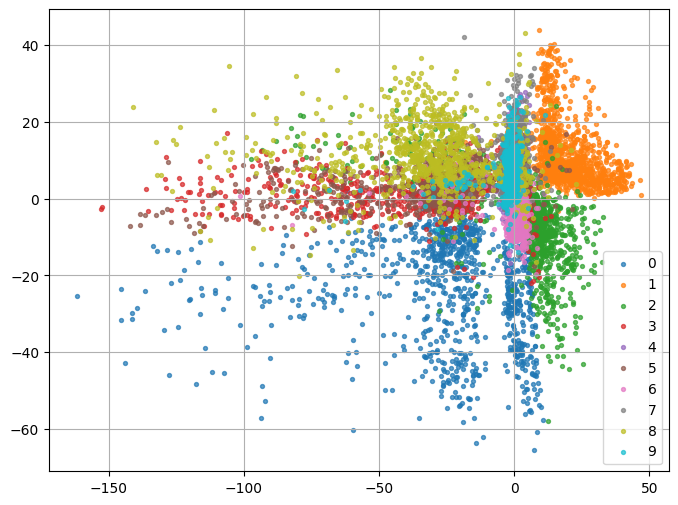

Improved Loss to 0.1696 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.82it/s]


Epoch 10 | Recon Loss: 0.1686 | KL Loss: 510.7358


100%|██████████| 157/157 [00:01<00:00, 101.17it/s]


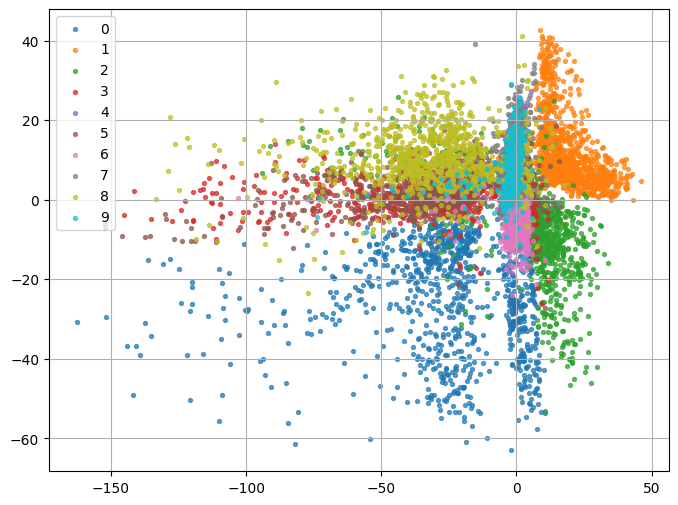

Improved Loss to 0.1686 .... Saving Model


100%|██████████| 157/157 [00:01<00:00, 97.08it/s] 


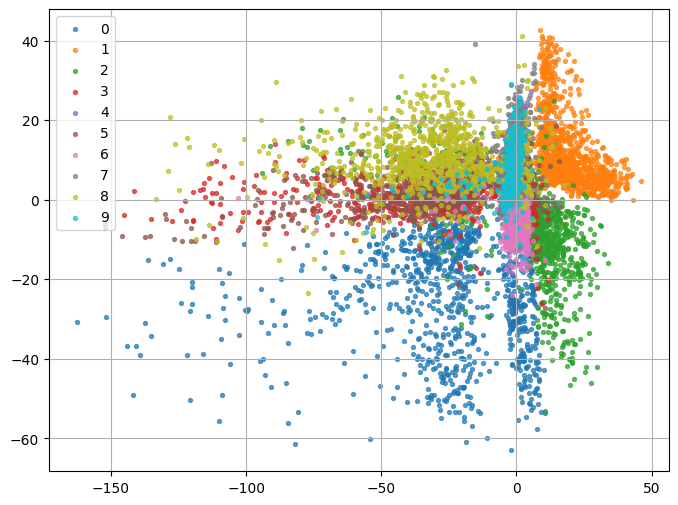

Interpolating between images


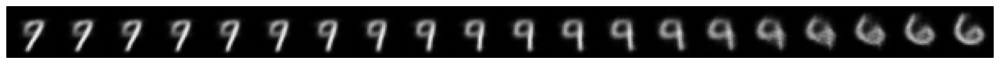

Generating reconstructions


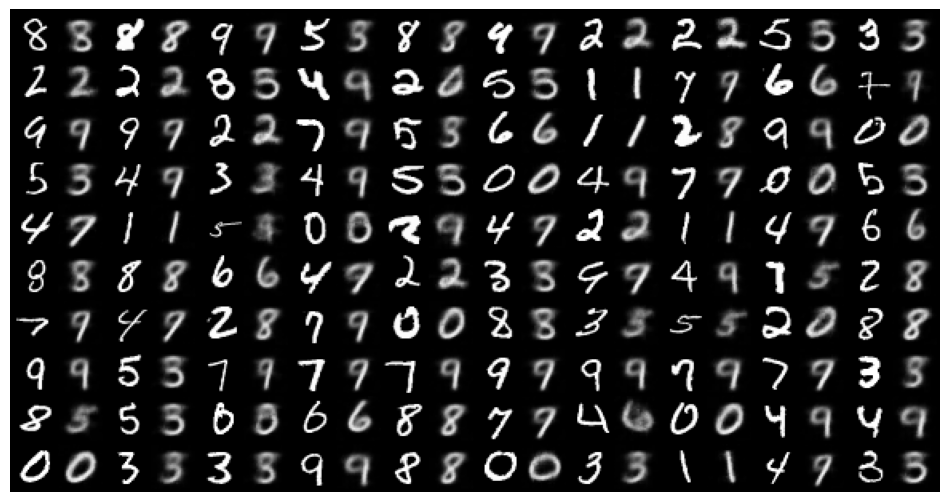

Generating manifold


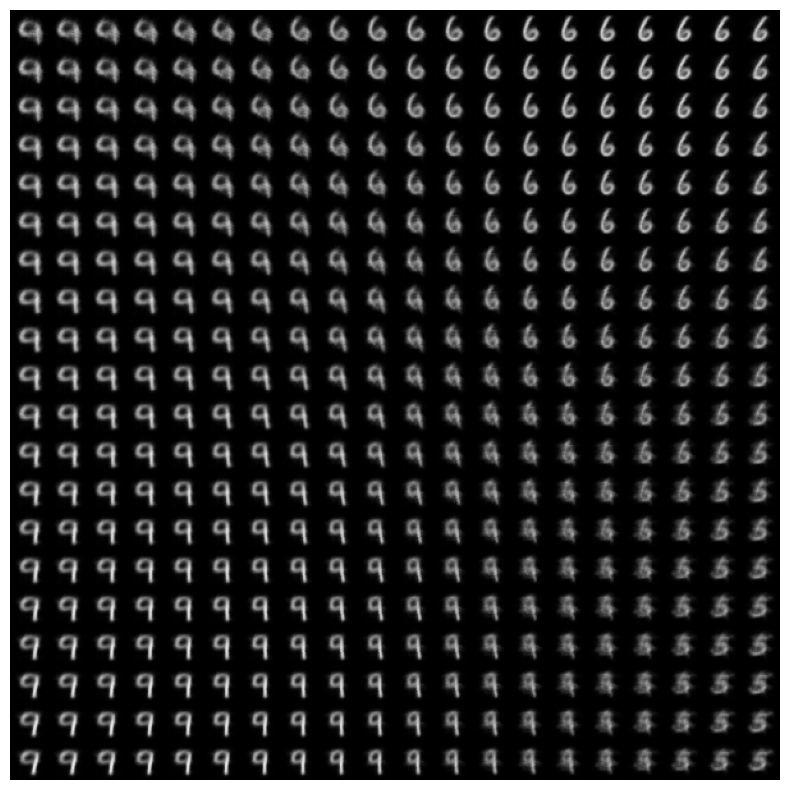

==============================Weight : 0.01==============================
{'model_params': {'in_channels': 1, 'convbn_blocks': 3, 'conv_kernel_size': [2, 2, 2], 'conv_kernel_strides': [2, 2, 2], 'convbn_channels': [1, 16, 32, 64], 'enc_fc_layers': [576, 128, 2], 'enc_fc_mu_activation': None, 'enc_fc_var_activation': None, 'conv_activation_fn': 'leaky', 'dec_fc_layers': [2, 128, 576], 'dec_fc_activation_fn': 'leaky', 'enc_fc_activation_fn': 'leaky', 'transpose_bn_blocks': 3, 'transposebn_channels': [64, 32, 16, 1], 'transpose_kernel_size': [3, 2, 2], 'transpose_kernel_strides': [2, 2, 2], 'transpose_activation_fn': 'tanh', 'log_variance': True, 'latent_dim': 2, 'concat_channel': False, 'decoder_fc_condition': False, 'num_classes': 10, 'conditional': False}, 'train_params': {'task_name': 'vae_kl', 'batch_size': 64, 'epochs': 10, 'kl_weight': 0.01, 'lr': 0.005, 'crit': 'l2', 'ckpt_name': 'best_vae_kl_ckpt.pth', 'seed': 111, 'save_training_image': False, 'output_train_dir': 'output', 'save

100%|██████████| 157/157 [00:01<00:00, 100.90it/s]


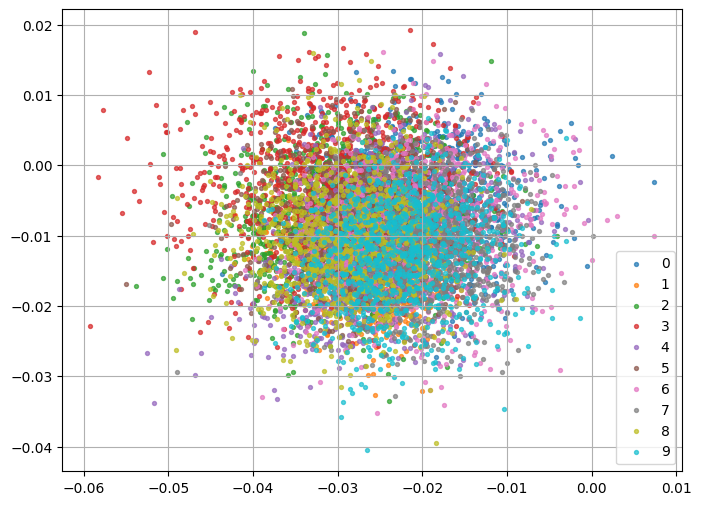

100%|██████████| 938/938 [00:10<00:00, 92.73it/s]


Epoch 1 | Recon Loss: 0.3488 | KL Loss: 1.7650


100%|██████████| 157/157 [00:01<00:00, 95.39it/s] 


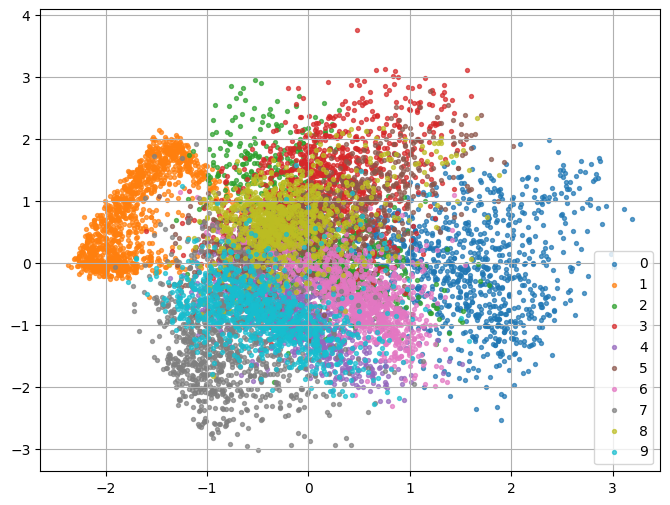

Improved Loss to 0.3664 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 90.81it/s]


Epoch 2 | Recon Loss: 0.2575 | KL Loss: 2.5988


100%|██████████| 157/157 [00:01<00:00, 97.16it/s]


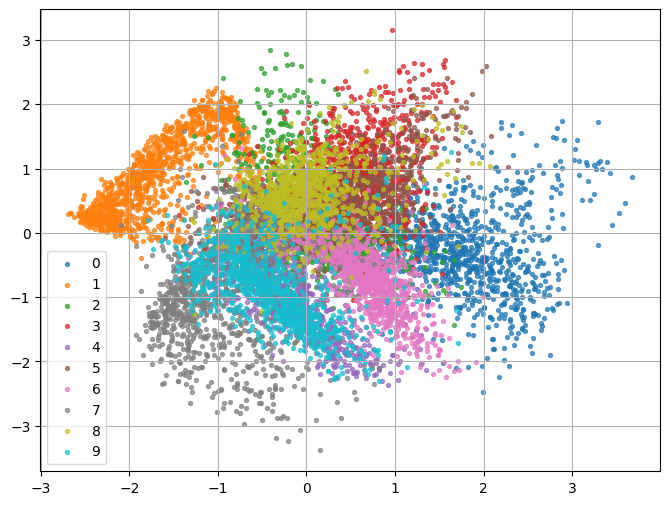

Improved Loss to 0.2834 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.77it/s]


Epoch 3 | Recon Loss: 0.2316 | KL Loss: 2.8579


100%|██████████| 157/157 [00:01<00:00, 96.78it/s] 


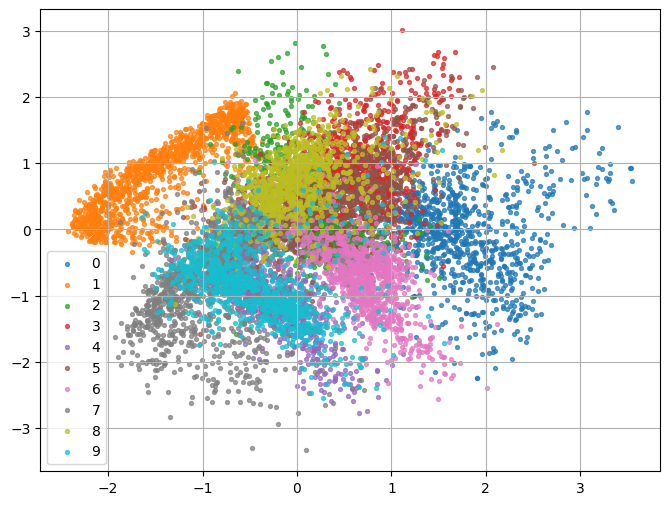

Improved Loss to 0.2602 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 92.08it/s] 


Epoch 4 | Recon Loss: 0.2024 | KL Loss: 3.0315


100%|██████████| 157/157 [00:01<00:00, 99.86it/s] 


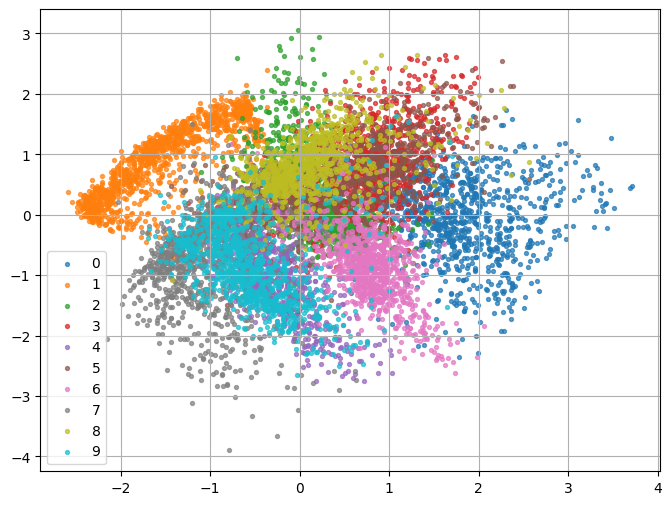

Improved Loss to 0.2327 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 92.50it/s]


Epoch 5 | Recon Loss: 0.1917 | KL Loss: 3.1571


100%|██████████| 157/157 [00:01<00:00, 98.34it/s] 


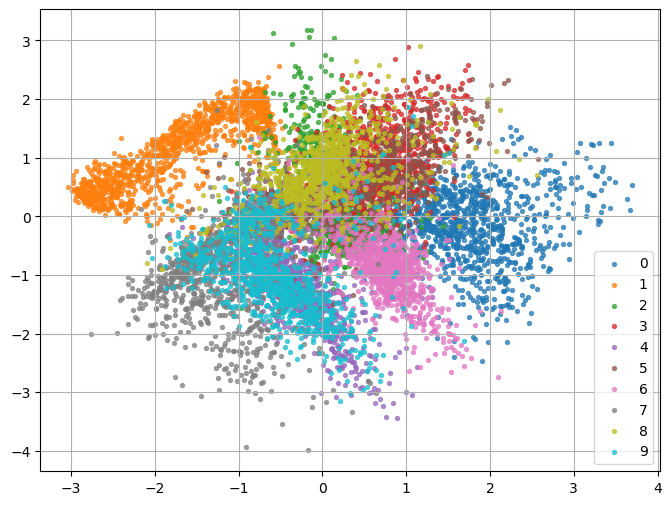

Improved Loss to 0.2233 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.20it/s]


Epoch 6 | Recon Loss: 0.1894 | KL Loss: 3.2357


100%|██████████| 157/157 [00:01<00:00, 89.68it/s]


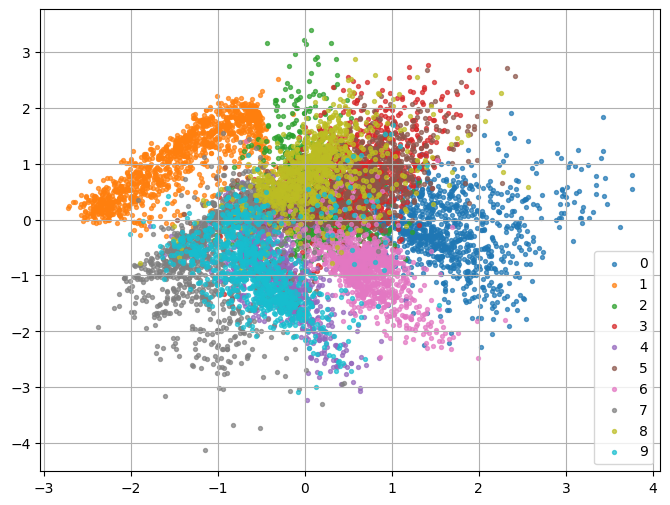

Improved Loss to 0.2217 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.23it/s]


Epoch 7 | Recon Loss: 0.1881 | KL Loss: 3.3091


100%|██████████| 157/157 [00:01<00:00, 98.57it/s] 


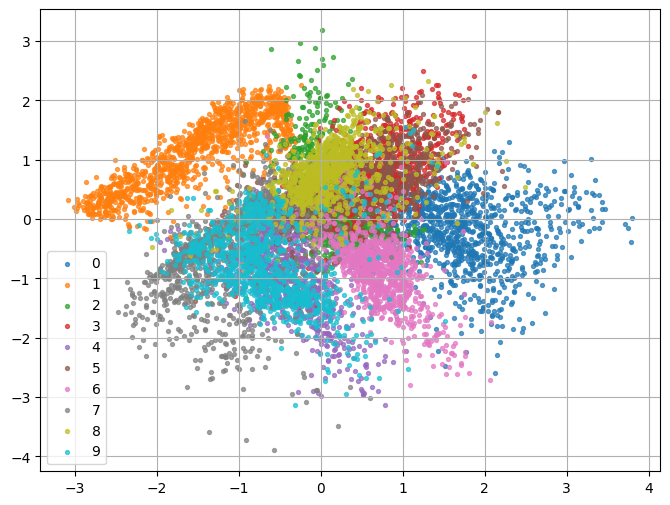

Improved Loss to 0.2212 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.20it/s]


Epoch 8 | Recon Loss: 0.1870 | KL Loss: 3.3627


100%|██████████| 157/157 [00:01<00:00, 96.67it/s] 


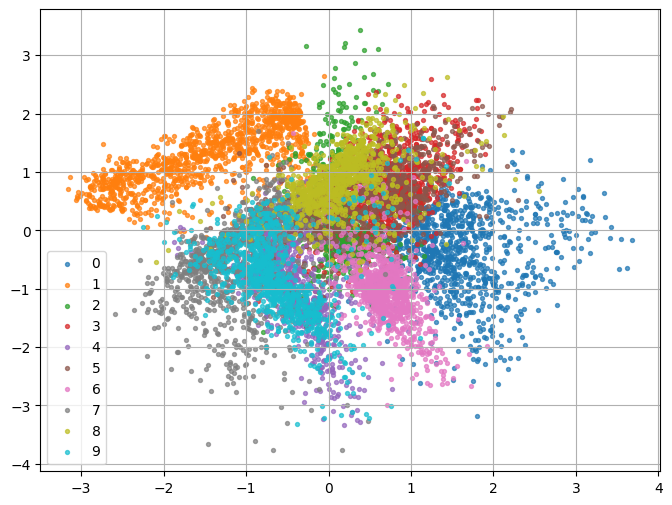

Improved Loss to 0.2207 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.23it/s]


Epoch 9 | Recon Loss: 0.1860 | KL Loss: 3.3947


100%|██████████| 157/157 [00:01<00:00, 96.23it/s] 


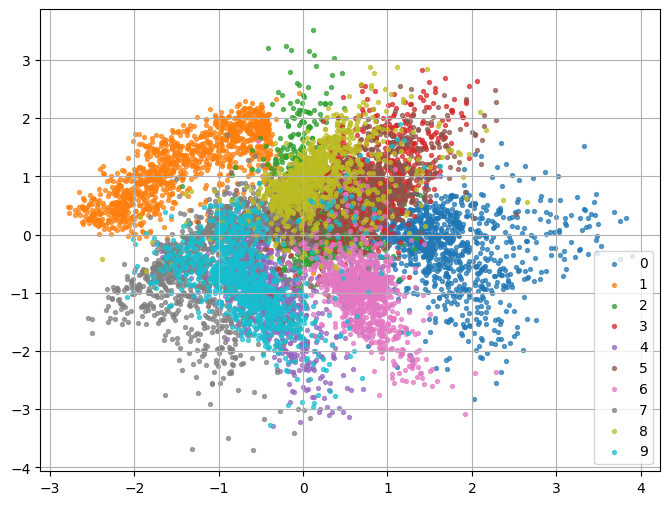

Improved Loss to 0.2199 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 91.70it/s]


Epoch 10 | Recon Loss: 0.1851 | KL Loss: 3.4238


100%|██████████| 157/157 [00:01<00:00, 94.45it/s] 


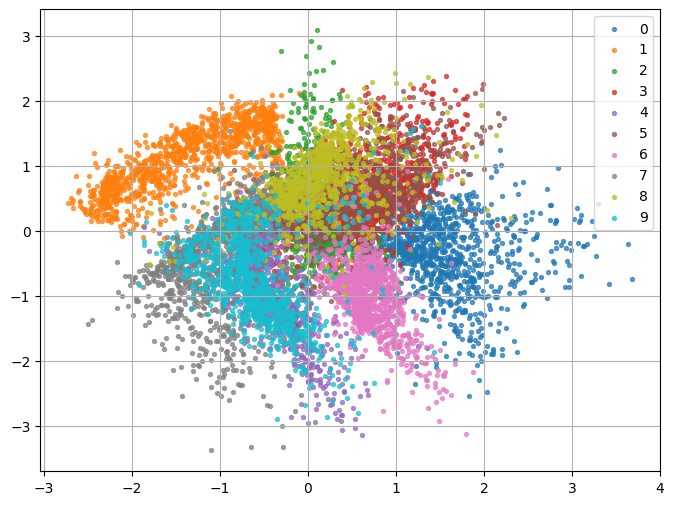

Improved Loss to 0.2193 .... Saving Model


100%|██████████| 157/157 [00:01<00:00, 96.69it/s] 


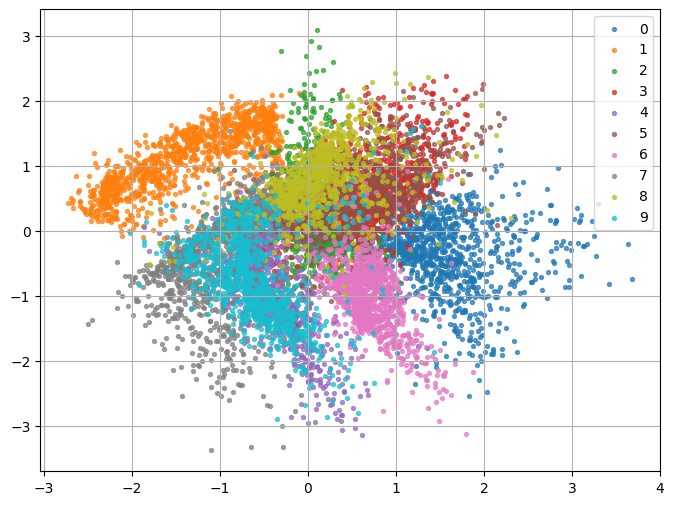

Interpolating between images


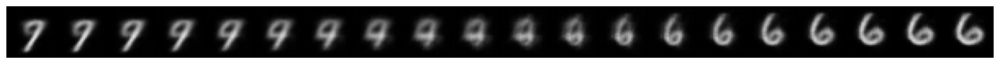

Generating reconstructions


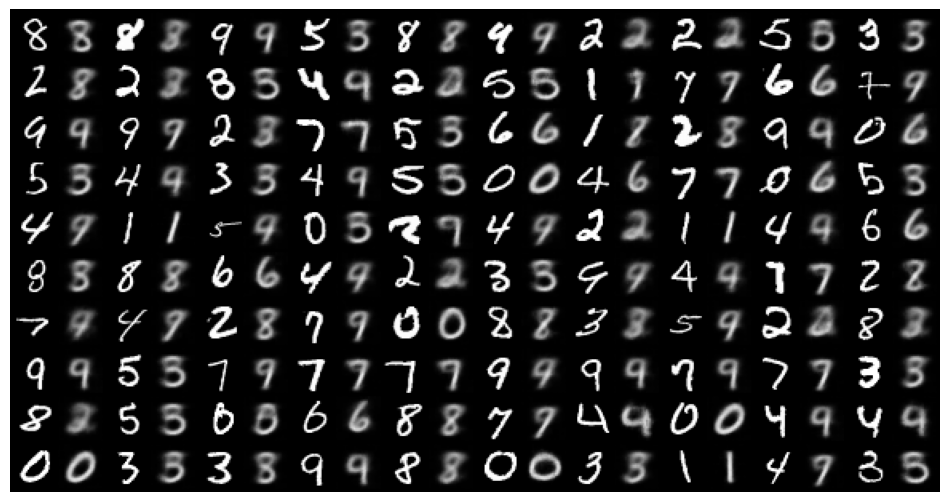

Generating manifold


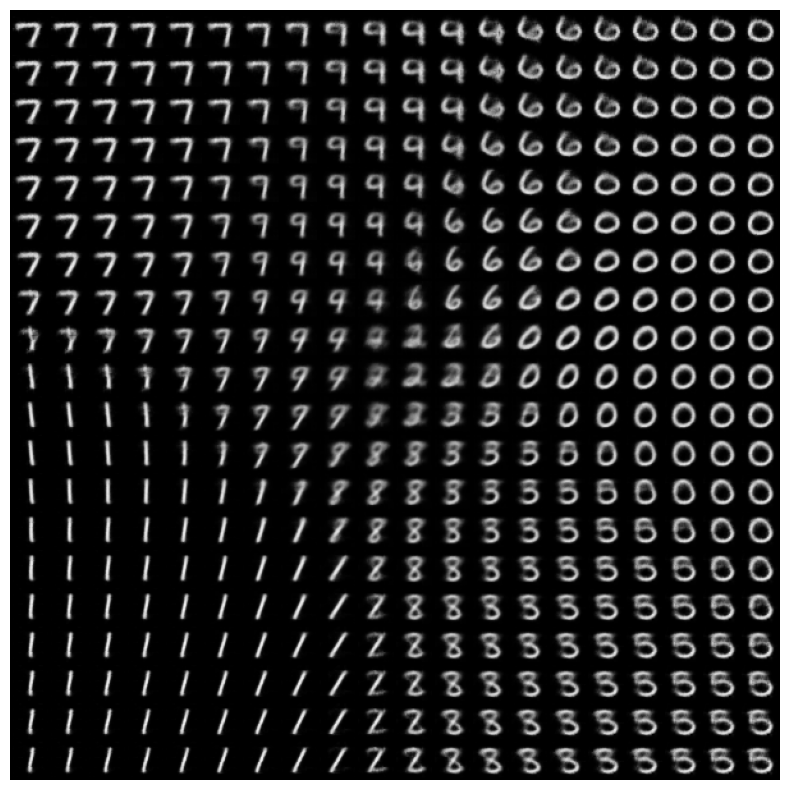

In [13]:
kl_weights = [1e-8, 1e-2]
for weight in kl_weights:
    print("="*30 + f"Weight : {weight}" + "="*30)
    config['train_params']['kl_weight'] = weight
    model = train(config, train_loader, test_loader)
    inference(config, test_dataset, test_loader)


## D
Increasing the latent dimensions increases the overall reconstruction quality at the cost of increasing the overfitting risk Also the stability of generation decreases. Decreasing the dimensions on the other hand decreases the reconstruction quality, reduces the chance of overfitting but creates an overall better more meaningful intepolation between 2 data points. I think having higher dimensions makes the model more prone to the problems attributed to the curse of dimensionality. Meaning the stabilit decreases and the dimensions become sort of sparse.

==============================Dim : 3==============================
{'model_params': {'in_channels': 1, 'convbn_blocks': 3, 'conv_kernel_size': [2, 2, 2], 'conv_kernel_strides': [2, 2, 2], 'convbn_channels': [1, 16, 32, 64], 'enc_fc_layers': [576, 128, 3], 'enc_fc_mu_activation': None, 'enc_fc_var_activation': None, 'conv_activation_fn': 'leaky', 'dec_fc_layers': [3, 128, 576], 'dec_fc_activation_fn': 'leaky', 'enc_fc_activation_fn': 'leaky', 'transpose_bn_blocks': 3, 'transposebn_channels': [64, 32, 16, 1], 'transpose_kernel_size': [3, 2, 2], 'transpose_kernel_strides': [2, 2, 2], 'transpose_activation_fn': 'tanh', 'log_variance': True, 'latent_dim': 3, 'concat_channel': False, 'decoder_fc_condition': False, 'num_classes': 10, 'conditional': False}, 'train_params': {'task_name': 'vae_kl', 'batch_size': 64, 'epochs': 10, 'kl_weight': 1e-05, 'lr': 0.005, 'crit': 'l2', 'ckpt_name': 'best_vae_kl_ckpt.pth', 'seed': 111, 'save_training_image': False, 'output_train_dir': 'output', 'save_late

100%|██████████| 157/157 [00:01<00:00, 88.78it/s]


Latent dimension > 2 and hence projecting


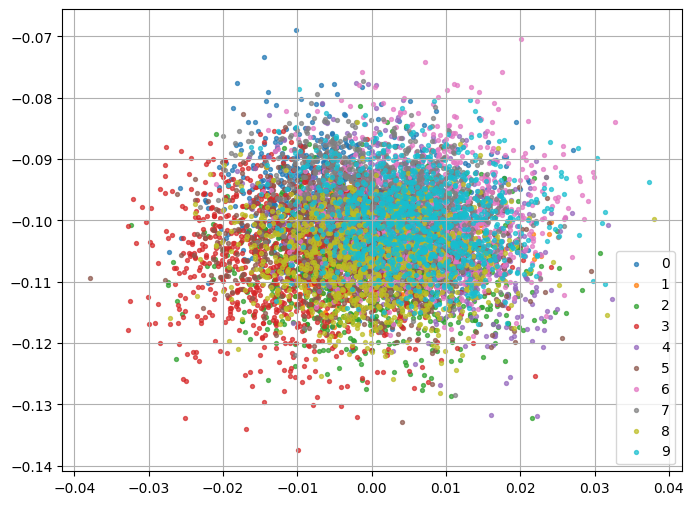

100%|██████████| 938/938 [00:10<00:00, 89.06it/s]


Epoch 1 | Recon Loss: 0.2476 | KL Loss: 113.2265


100%|██████████| 157/157 [00:01<00:00, 97.38it/s] 


Latent dimension > 2 and hence projecting


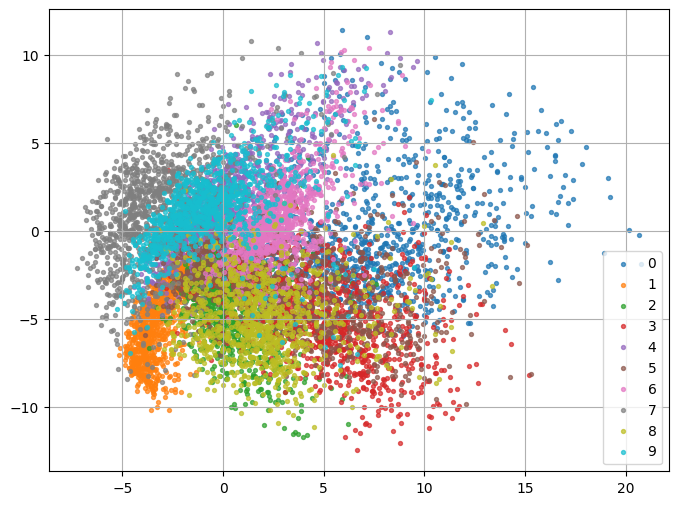

Improved Loss to 0.2488 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.98it/s]


Epoch 2 | Recon Loss: 0.1584 | KL Loss: 38.7693


100%|██████████| 157/157 [00:01<00:00, 95.66it/s] 


Latent dimension > 2 and hence projecting


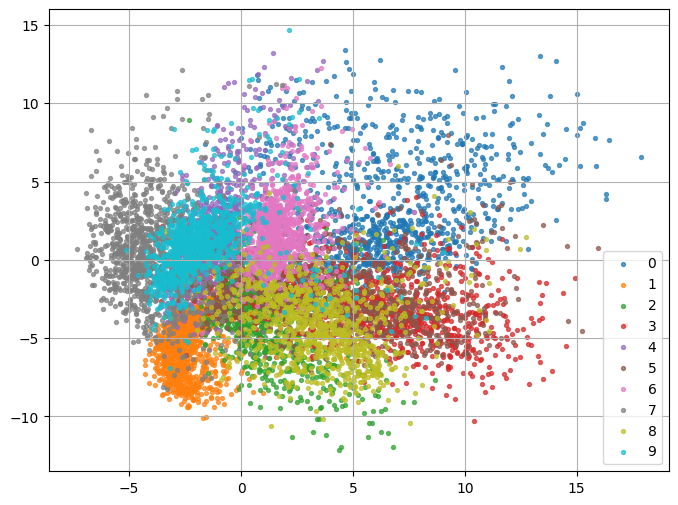

Improved Loss to 0.1588 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 85.81it/s]


Epoch 3 | Recon Loss: 0.1516 | KL Loss: 36.8323


100%|██████████| 157/157 [00:02<00:00, 76.51it/s]


Latent dimension > 2 and hence projecting


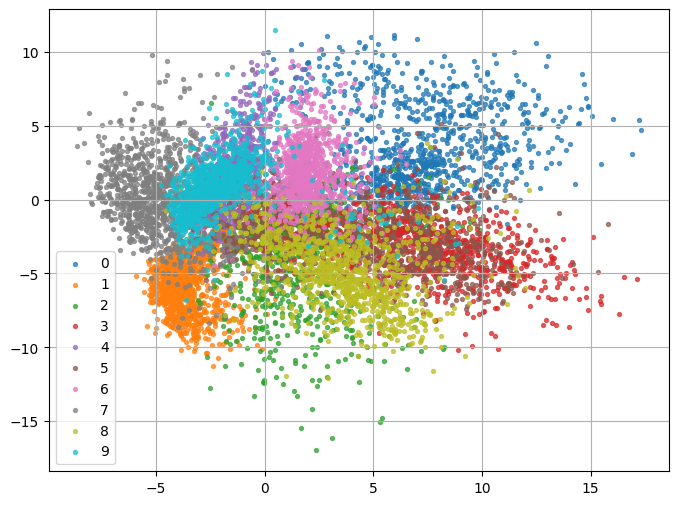

Improved Loss to 0.1520 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 87.85it/s]


Epoch 4 | Recon Loss: 0.1482 | KL Loss: 36.7842


100%|██████████| 157/157 [00:01<00:00, 92.23it/s]


Latent dimension > 2 and hence projecting


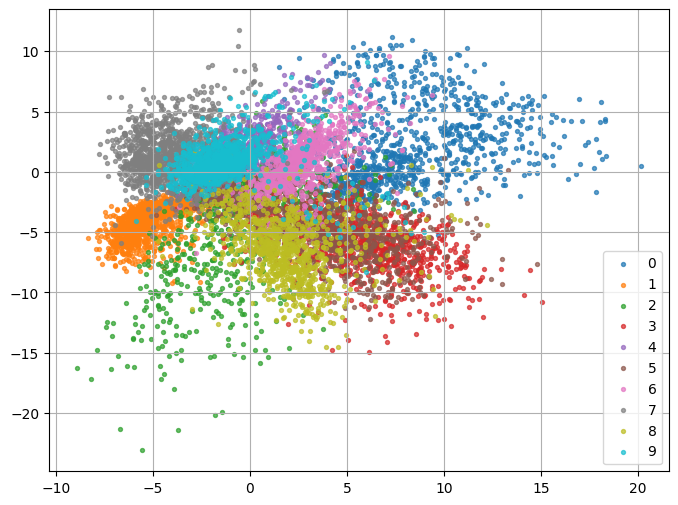

Improved Loss to 0.1486 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 87.98it/s]


Epoch 5 | Recon Loss: 0.1460 | KL Loss: 36.8111


100%|██████████| 157/157 [00:01<00:00, 95.02it/s] 


Latent dimension > 2 and hence projecting


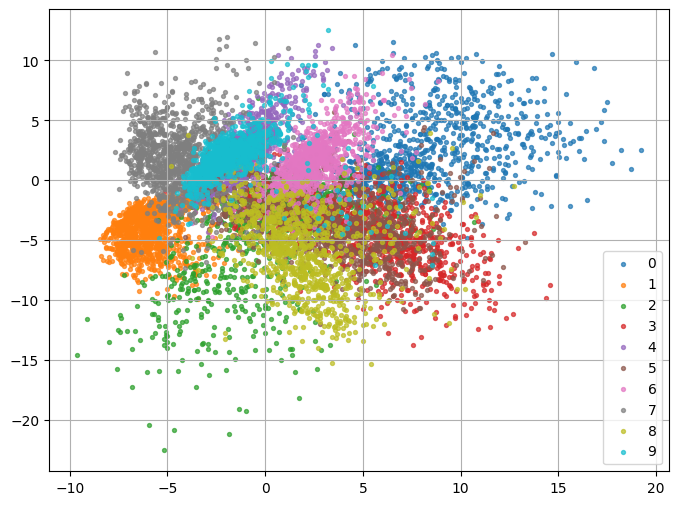

Improved Loss to 0.1464 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.29it/s]


Epoch 6 | Recon Loss: 0.1443 | KL Loss: 36.6554


100%|██████████| 157/157 [00:01<00:00, 96.03it/s] 


Latent dimension > 2 and hence projecting


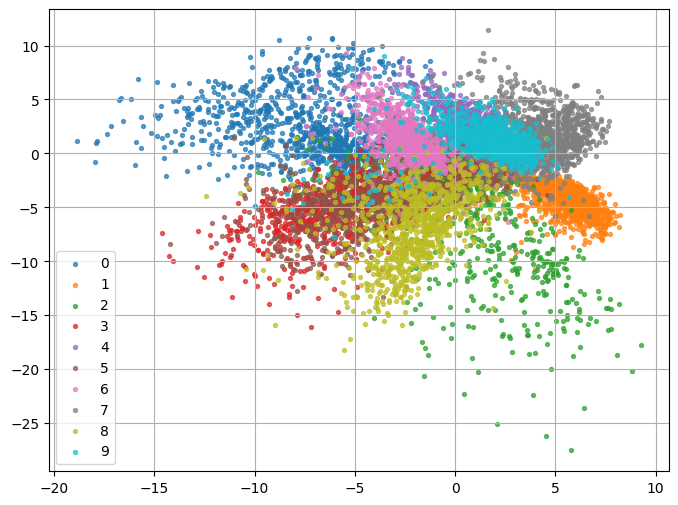

Improved Loss to 0.1447 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.14it/s]


Epoch 7 | Recon Loss: 0.1432 | KL Loss: 37.6410


100%|██████████| 157/157 [00:01<00:00, 92.62it/s]


Latent dimension > 2 and hence projecting


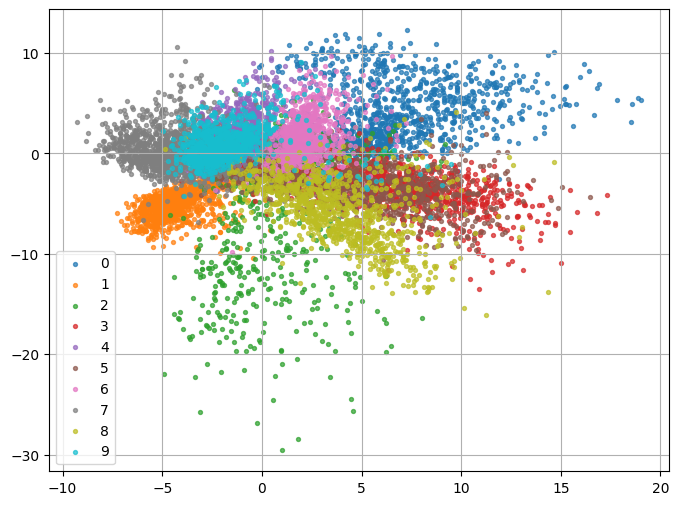

Improved Loss to 0.1435 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 87.59it/s]


Epoch 8 | Recon Loss: 0.1424 | KL Loss: 38.5478


100%|██████████| 157/157 [00:01<00:00, 96.42it/s] 


Latent dimension > 2 and hence projecting


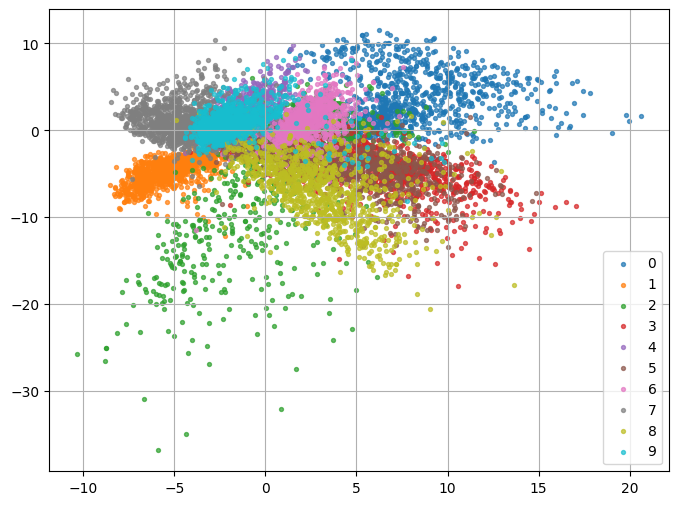

Improved Loss to 0.1428 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 87.56it/s]


Epoch 9 | Recon Loss: 0.1416 | KL Loss: 39.3543


100%|██████████| 157/157 [00:01<00:00, 95.50it/s] 


Latent dimension > 2 and hence projecting


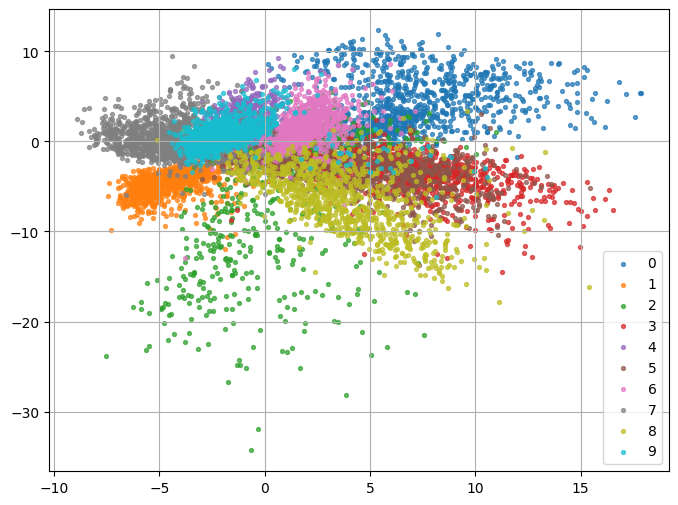

Improved Loss to 0.1420 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.29it/s]


Epoch 10 | Recon Loss: 0.1407 | KL Loss: 39.0897


100%|██████████| 157/157 [00:01<00:00, 91.00it/s] 


Latent dimension > 2 and hence projecting


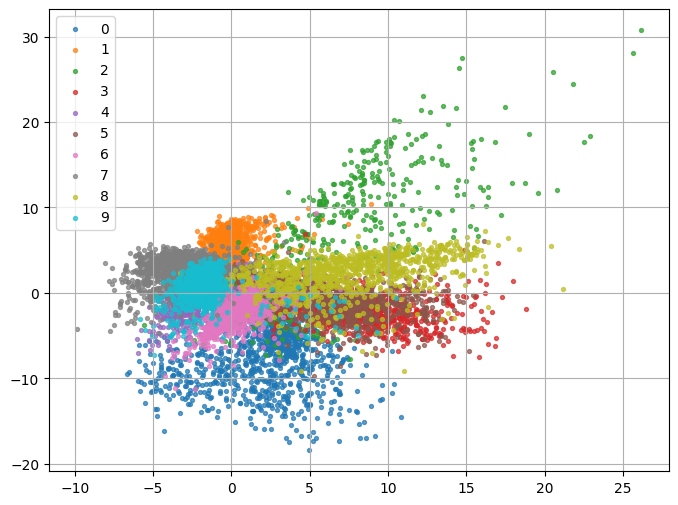

Improved Loss to 0.1411 .... Saving Model


100%|██████████| 157/157 [00:01<00:00, 93.81it/s] 


Latent dimension > 2 and hence projecting


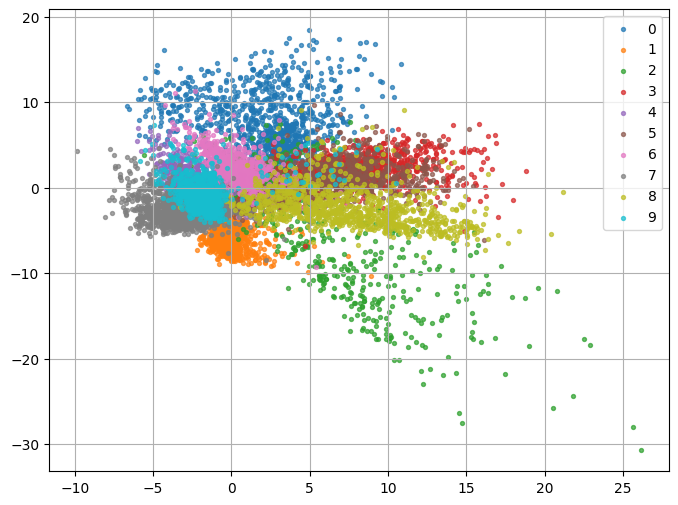

Interpolating between images


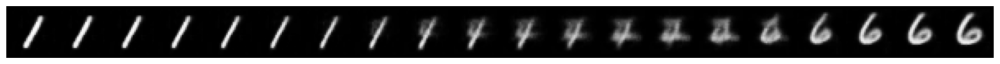

Generating reconstructions


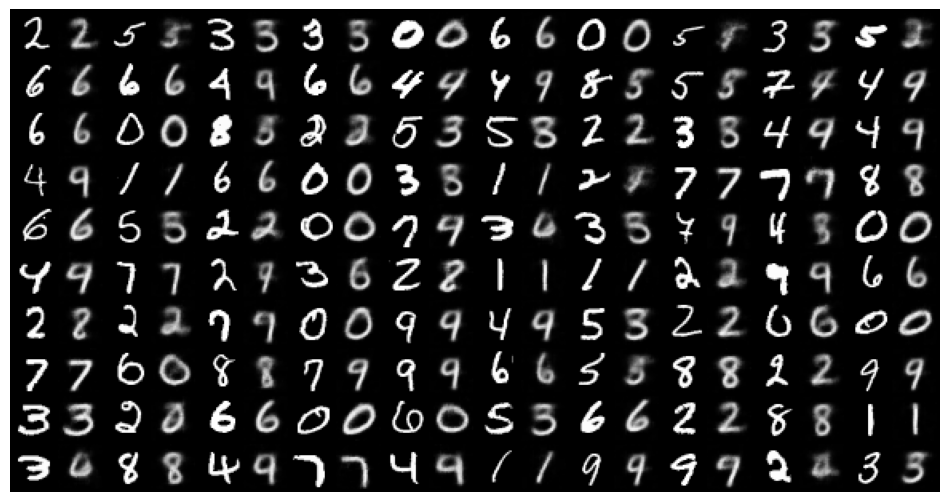

Manifold visualization is only supported directly for latent_dim=2
==============================Dim : 4==============================
{'model_params': {'in_channels': 1, 'convbn_blocks': 3, 'conv_kernel_size': [2, 2, 2], 'conv_kernel_strides': [2, 2, 2], 'convbn_channels': [1, 16, 32, 64], 'enc_fc_layers': [576, 128, 4], 'enc_fc_mu_activation': None, 'enc_fc_var_activation': None, 'conv_activation_fn': 'leaky', 'dec_fc_layers': [4, 128, 576], 'dec_fc_activation_fn': 'leaky', 'enc_fc_activation_fn': 'leaky', 'transpose_bn_blocks': 3, 'transposebn_channels': [64, 32, 16, 1], 'transpose_kernel_size': [3, 2, 2], 'transpose_kernel_strides': [2, 2, 2], 'transpose_activation_fn': 'tanh', 'log_variance': True, 'latent_dim': 4, 'concat_channel': False, 'decoder_fc_condition': False, 'num_classes': 10, 'conditional': False}, 'train_params': {'task_name': 'vae_kl', 'batch_size': 64, 'epochs': 10, 'kl_weight': 1e-05, 'lr': 0.005, 'crit': 'l2', 'ckpt_name': 'best_vae_kl_ckpt.pth', 'seed': 111, 'sa

100%|██████████| 157/157 [00:01<00:00, 91.69it/s]


Latent dimension > 2 and hence projecting


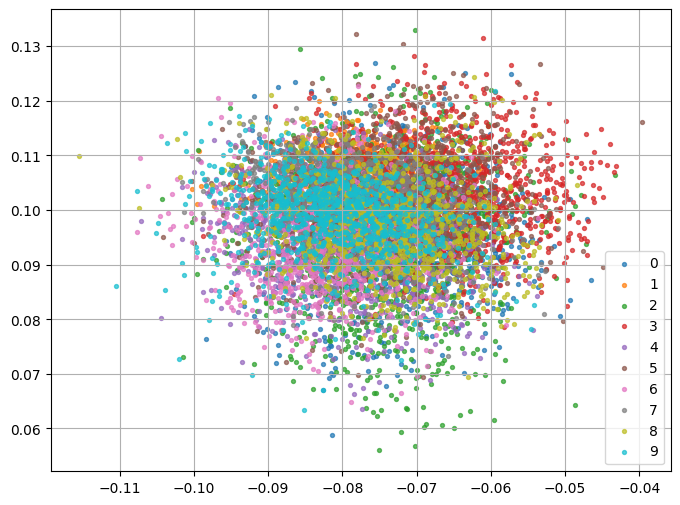

100%|██████████| 938/938 [00:10<00:00, 88.89it/s]


Epoch 1 | Recon Loss: 0.2166 | KL Loss: 68.0492


100%|██████████| 157/157 [00:01<00:00, 92.80it/s] 


Latent dimension > 2 and hence projecting


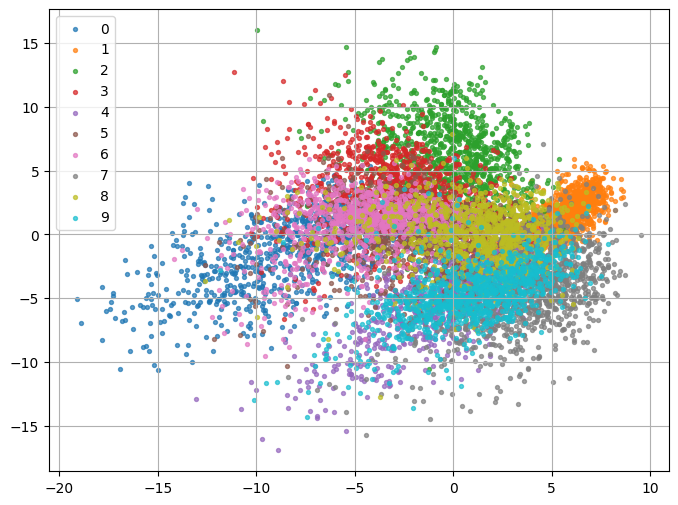

Improved Loss to 0.2173 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.12it/s]


Epoch 2 | Recon Loss: 0.1381 | KL Loss: 44.7383


100%|██████████| 157/157 [00:01<00:00, 96.88it/s] 


Latent dimension > 2 and hence projecting


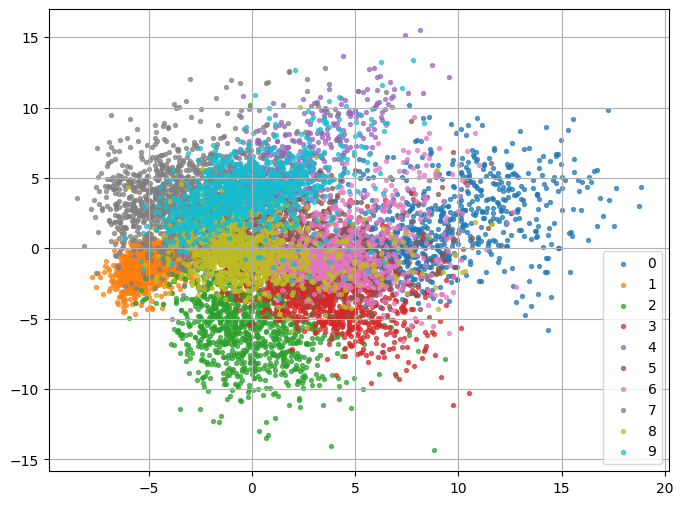

Improved Loss to 0.1385 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.12it/s]


Epoch 3 | Recon Loss: 0.1290 | KL Loss: 42.8891


100%|██████████| 157/157 [00:01<00:00, 96.10it/s] 


Latent dimension > 2 and hence projecting


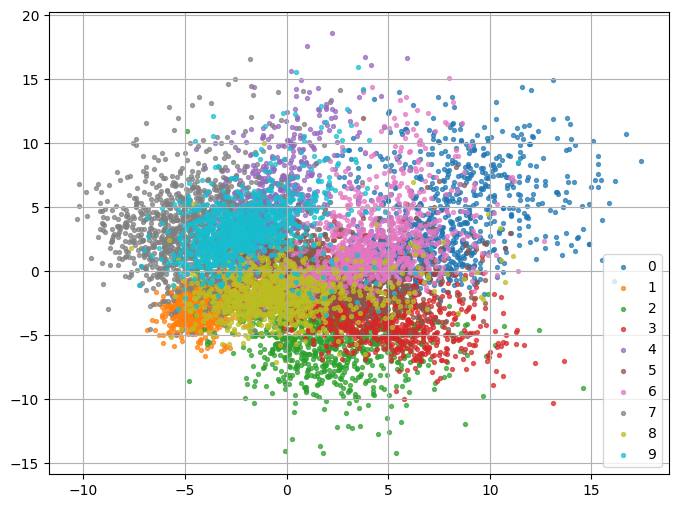

Improved Loss to 0.1295 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.18it/s]


Epoch 4 | Recon Loss: 0.1260 | KL Loss: 42.7646


100%|██████████| 157/157 [00:01<00:00, 94.30it/s] 


Latent dimension > 2 and hence projecting


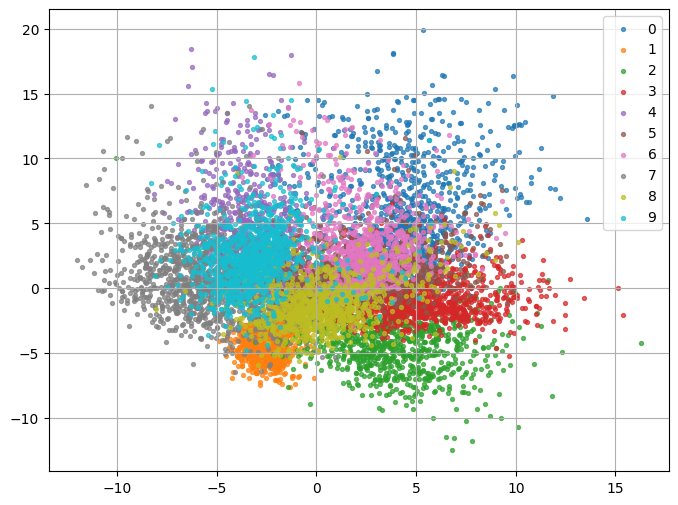

Improved Loss to 0.1265 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.69it/s]


Epoch 5 | Recon Loss: 0.1241 | KL Loss: 42.4697


100%|██████████| 157/157 [00:01<00:00, 92.71it/s]


Latent dimension > 2 and hence projecting


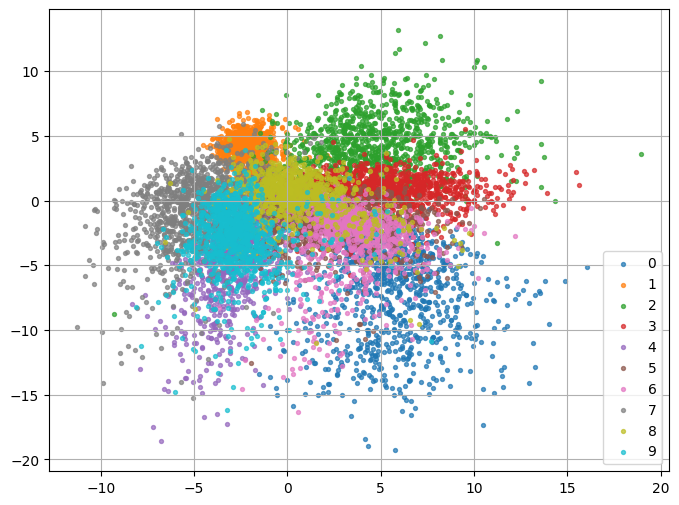

Improved Loss to 0.1245 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.34it/s]


Epoch 6 | Recon Loss: 0.1227 | KL Loss: 42.4104


100%|██████████| 157/157 [00:01<00:00, 97.10it/s] 


Latent dimension > 2 and hence projecting


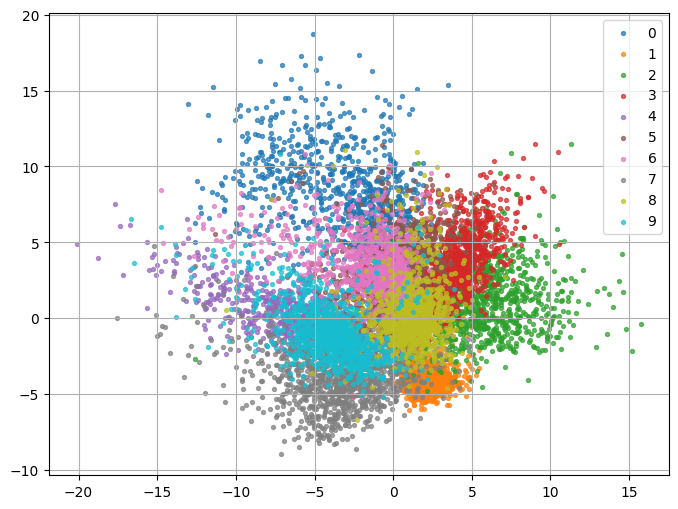

Improved Loss to 0.1231 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 89.04it/s]


Epoch 7 | Recon Loss: 0.1218 | KL Loss: 43.0862


100%|██████████| 157/157 [00:01<00:00, 94.57it/s]


Latent dimension > 2 and hence projecting


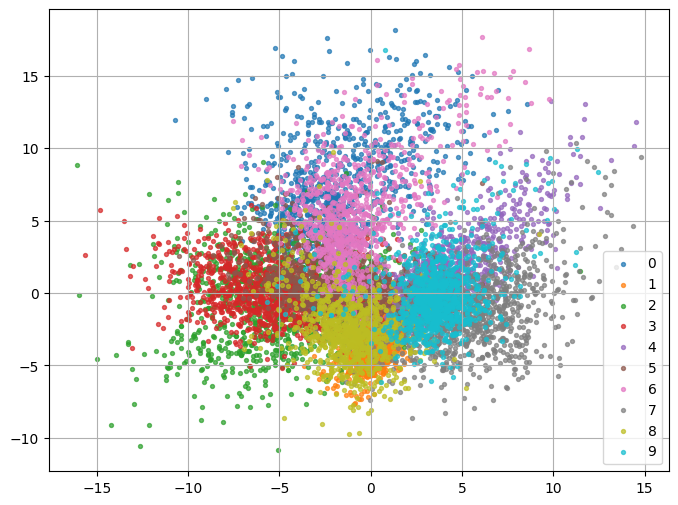

Improved Loss to 0.1223 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 89.26it/s]


Epoch 8 | Recon Loss: 0.1210 | KL Loss: 43.3739


100%|██████████| 157/157 [00:01<00:00, 97.14it/s] 


Latent dimension > 2 and hence projecting


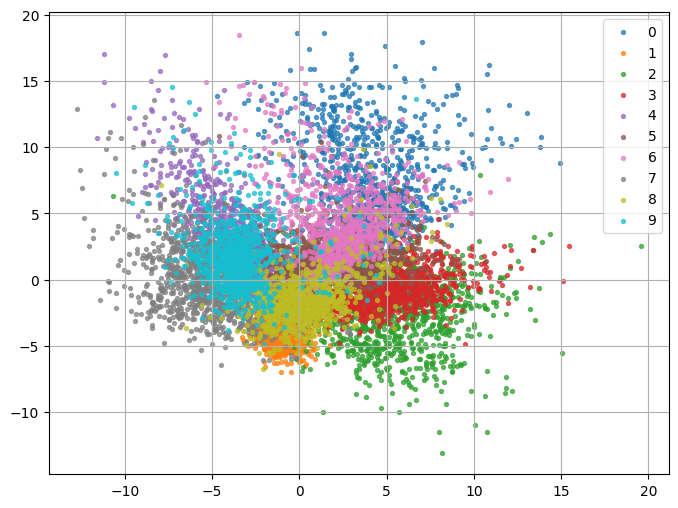

Improved Loss to 0.1214 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 89.45it/s]


Epoch 9 | Recon Loss: 0.1201 | KL Loss: 43.5132


100%|██████████| 157/157 [00:01<00:00, 93.31it/s] 


Latent dimension > 2 and hence projecting


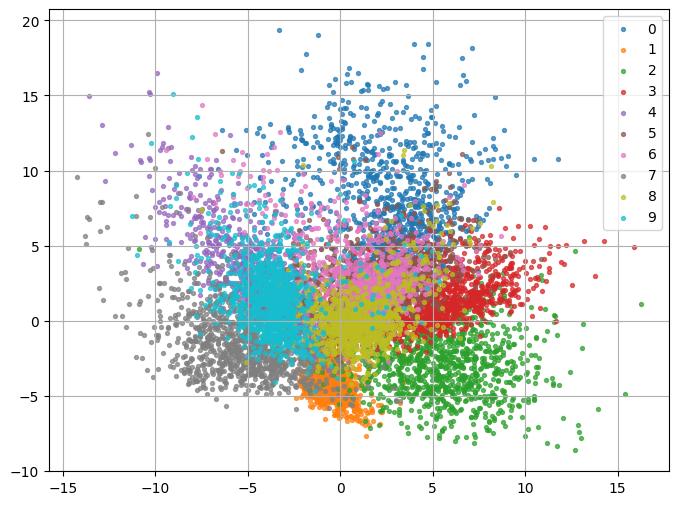

Improved Loss to 0.1206 .... Saving Model


100%|██████████| 938/938 [00:10<00:00, 88.28it/s]


Epoch 10 | Recon Loss: 0.1196 | KL Loss: 43.7561


100%|██████████| 157/157 [00:01<00:00, 96.91it/s] 


Latent dimension > 2 and hence projecting


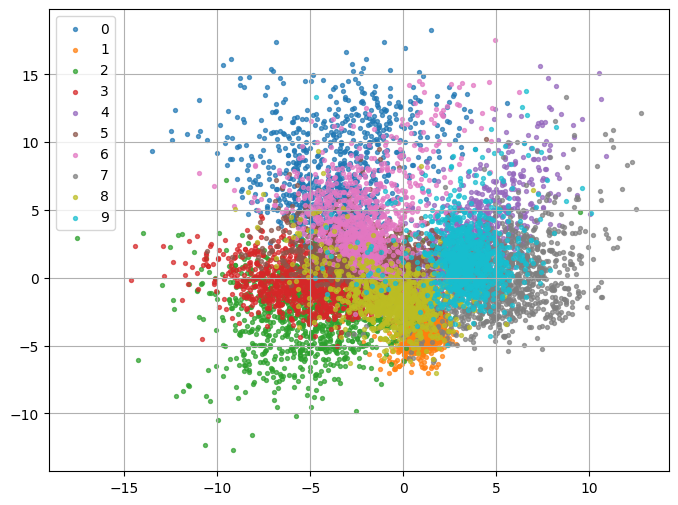

Improved Loss to 0.1200 .... Saving Model


100%|██████████| 157/157 [00:01<00:00, 93.30it/s]


Latent dimension > 2 and hence projecting


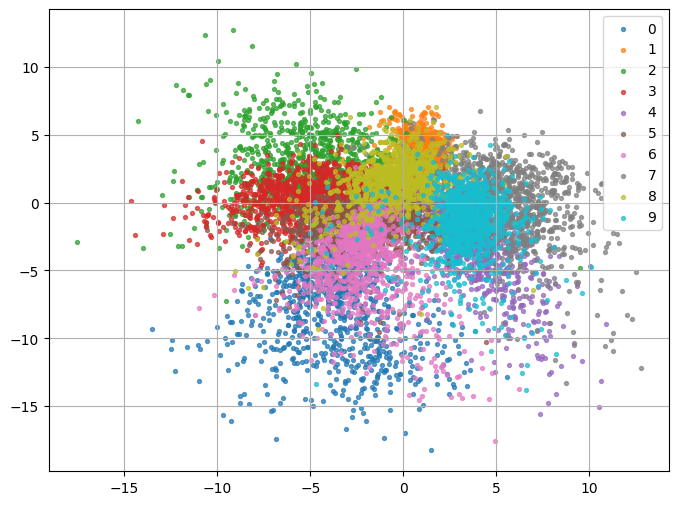

Interpolating between images


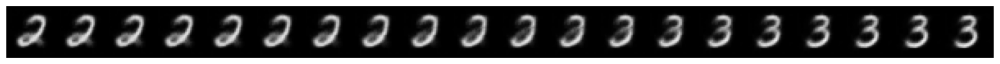

Generating reconstructions


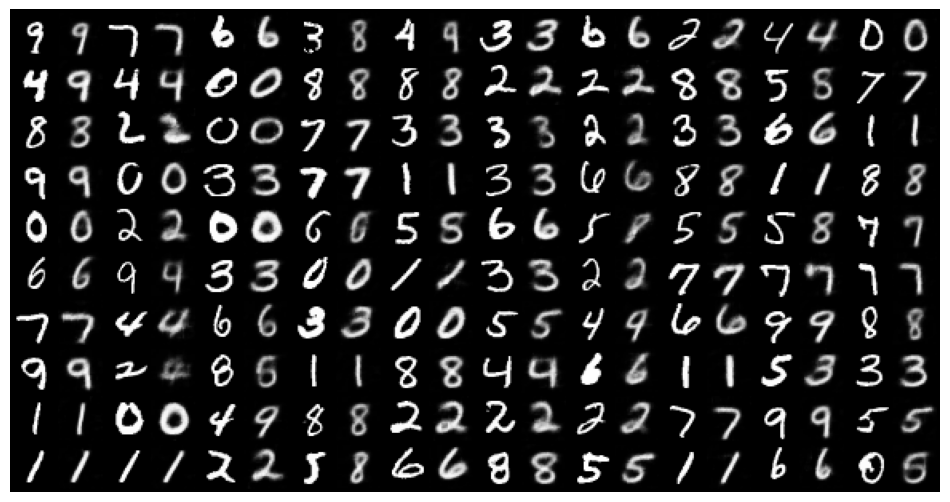

Manifold visualization is only supported directly for latent_dim=2


In [17]:
config['train_params']['kl_weight'] = 1e-5
dims = [3, 4]
for dim in dims:
    print("="*30 + f"Dim : {dim}" + "="*30)
    config['model_params']['latent_dim'] = dim
    config['model_params']['enc_fc_layers'][-1] = dim
    config['model_params']['dec_fc_layers'][0] = dim
    model = train(config, train_loader, test_loader)
    inference(config, test_dataset, test_loader)

## E
Model B is the best for generation and A is the closest to a normal Auto encoder. In model the B mean and variance of the learnd distribution is very close to $N(0,I)$. So sampling from the normal distribution and using that with the decoder will result in a better output. The main reason for model A being closer to normal Auto encoders is the very small variance and very small reconstruction error. In the normal Auto encoder we expect the variance to be 0 and this is in line with that.